In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [8]:
df=pd.read_csv('/content/drive/MyDrive/nasa.csv')

In [9]:
df

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),...,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox,Hazardous
0,3703080,3703080,21.600,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000,True
1,3723955,3723955,21.300,0.146068,0.326618,146.067964,326.617897,0.090762,0.202951,479.225620,...,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000,False
2,2446862,2446862,20.300,0.231502,0.517654,231.502122,517.654482,0.143849,0.321655,759.521423,...,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000,True
3,3092506,3092506,27.400,0.008801,0.019681,8.801465,19.680675,0.005469,0.012229,28.876199,...,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000,False
4,3514799,3514799,21.600,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,...,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4682,3759007,3759007,23.900,0.044112,0.098637,44.111820,98.637028,0.027410,0.061290,144.723824,...,164.183305,457.179984,0.741558,276.395697,1.581299,2.457708e+06,304.306025,0.787436,J2000,False
4683,3759295,3759295,28.200,0.006089,0.013616,6.089126,13.615700,0.003784,0.008460,19.977449,...,345.225230,407.185767,0.996434,42.111064,1.153835,2.458088e+06,282.978786,0.884117,J2000,False
4684,3759714,3759714,22.700,0.076658,0.171412,76.657557,171.411509,0.047633,0.106510,251.501180,...,37.026468,690.054279,0.965760,274.692712,2.090708,2.458300e+06,203.501147,0.521698,J2000,False
4685,3759720,3759720,21.800,0.116026,0.259442,116.025908,259.441818,0.072095,0.161210,380.662441,...,163.802910,662.048343,1.185467,180.346090,1.787733,2.458288e+06,203.524965,0.543767,J2000,False


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4687 entries, 0 to 4686
Data columns (total 40 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Neo Reference ID              4687 non-null   int64  
 1   Name                          4687 non-null   int64  
 2   Absolute Magnitude            4687 non-null   float64
 3   Est Dia in KM(min)            4687 non-null   float64
 4   Est Dia in KM(max)            4687 non-null   float64
 5   Est Dia in M(min)             4687 non-null   float64
 6   Est Dia in M(max)             4687 non-null   float64
 7   Est Dia in Miles(min)         4687 non-null   float64
 8   Est Dia in Miles(max)         4687 non-null   float64
 9   Est Dia in Feet(min)          4687 non-null   float64
 10  Est Dia in Feet(max)          4687 non-null   float64
 11  Close Approach Date           4687 non-null   object 
 12  Epoch Date Close Approach     4687 non-null   int64  
 13  Rel

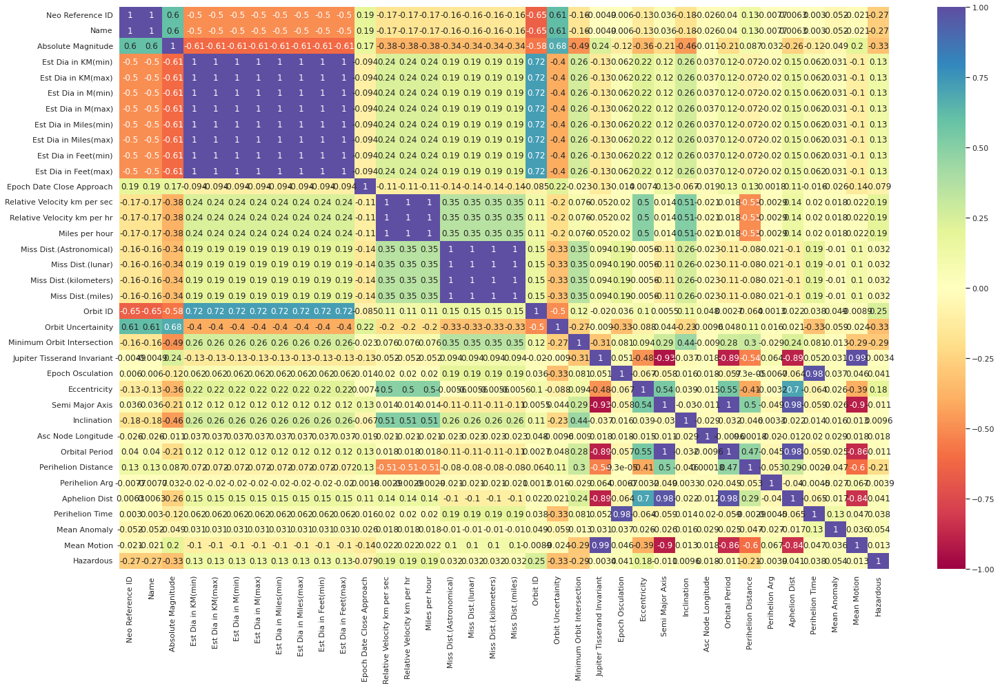

In [11]:
sns.set(rc={'figure.figsize':(25,15)})
sns.heatmap(df.corr(), vmin=-1, vmax=1, cmap="Spectral", annot=True)
plt.show()
plt.close()

In [12]:
# Dropping completely correlated features and datetime features
df = df.drop(['Est Dia in M(min)', 'Est Dia in M(max)', 'Est Dia in Miles(min)', 'Est Dia in Miles(max)', 'Est Dia in Feet(min)', 'Est Dia in Feet(max)', 'Est Dia in KM(max)',
              'Relative Velocity km per hr', 'Miles per hour',
              'Miss Dist.(Astronomical)', 'Miss Dist.(lunar)', 'Miss Dist.(miles)',
              'Semi Major Axis',
              'Neo Reference ID', 'Name',
              'Close Approach Date', 'Epoch Date Close Approach', 'Orbit Determination Date','Equinox','Orbiting Body'],axis=1)



In [13]:
df.head()

,Absolute Magnitude,Est Dia in KM(min),Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Hazardous
0,21.6,0.127220,6.115834,62753692.0,17,5,0.025282,4.634,2458000.5,0.425549,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,True
1,21.3,0.146068,18.113985,57298148.0,21,3,0.186935,5.457,2458000.5,0.351674,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,False
2,20.3,0.231502,7.590711,7622911.5,22,0,0.043058,4.557,2458000.5,0.348248,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,True
3,27.4,0.008801,11.173874,42683616.0,7,6,0.005512,5.093,2458000.5,0.216578,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,False
4,21.6,0.127220,9.840831,61010824.0,25,1,0.034798,5.154,2458000.5,0.210448,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,True


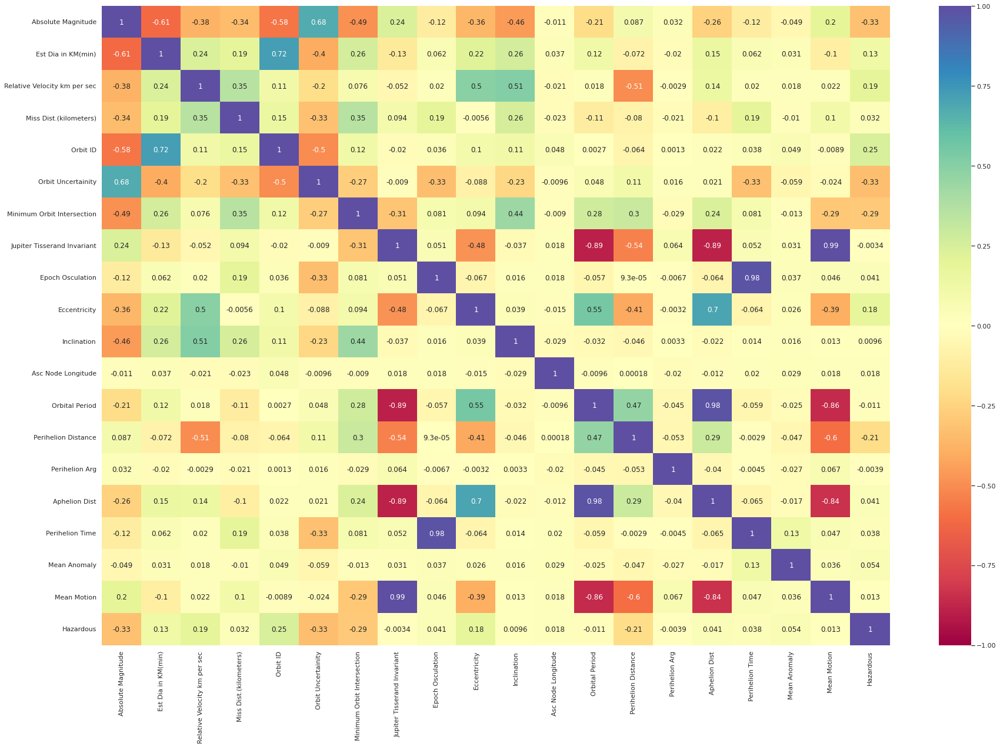

In [14]:
# Plotting feature correlation with reduced dataset
sns.set(rc={'figure.figsize':(30,20)})
sns.heatmap(df.corr(), vmin=-1, vmax=1, cmap="Spectral", annot=True)
plt.show()
plt.close()

In [15]:
df.shape

(4687, 20)

In [16]:
#encoding the y variable
from sklearn.preprocessing import LabelEncoder
l_enc = LabelEncoder()
df['hazardous'] = l_enc.fit_transform(df.Hazardous)

In [17]:
df.head()

,Absolute Magnitude,Est Dia in KM(min),Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,...,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Hazardous,hazardous
0,21.6,0.127220,6.115834,62753692.0,17,5,0.025282,4.634,2458000.5,0.425549,...,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,True,1
1,21.3,0.146068,18.113985,57298148.0,21,3,0.186935,5.457,2458000.5,0.351674,...,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,False,0
2,20.3,0.231502,7.590711,7622911.5,22,0,0.043058,4.557,2458000.5,0.348248,...,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,True,1
3,27.4,0.008801,11.173874,42683616.0,7,6,0.005512,5.093,2458000.5,0.216578,...,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,False,0
4,21.6,0.127220,9.840831,61010824.0,25,1,0.034798,5.154,2458000.5,0.210448,...,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,True,1


In [18]:
df=df.drop(['Hazardous'],axis=1)

In [19]:
df.head()

,Absolute Magnitude,Est Dia in KM(min),Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,hazardous
0,21.6,0.127220,6.115834,62753692.0,17,5,0.025282,4.634,2458000.5,0.425549,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,1
1,21.3,0.146068,18.113985,57298148.0,21,3,0.186935,5.457,2458000.5,0.351674,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,0
2,20.3,0.231502,7.590711,7622911.5,22,0,0.043058,4.557,2458000.5,0.348248,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,1
3,27.4,0.008801,11.173874,42683616.0,7,6,0.005512,5.093,2458000.5,0.216578,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,0
4,21.6,0.127220,9.840831,61010824.0,25,1,0.034798,5.154,2458000.5,0.210448,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,1


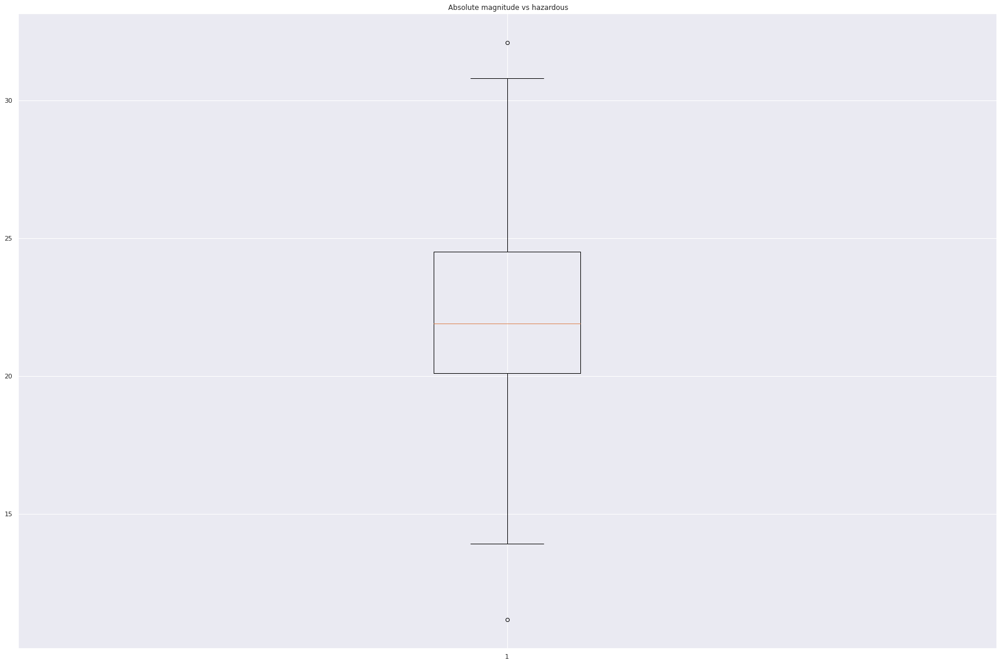

In [20]:
plt.title(" Absolute magnitude vs hazardous")
x1=df['Absolute Magnitude']
y=df['hazardous']
plt.boxplot(x1)
plt.show()

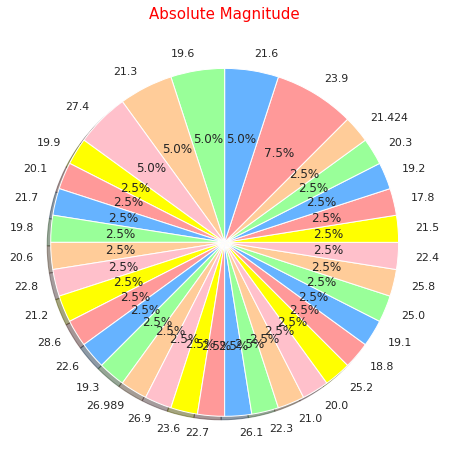

In [87]:
labels = df["Absolute Magnitude"][:40].value_counts().index
sizes = df["Absolute Magnitude"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Absolute Magnitude',color = 'red',fontsize = 15)
plt.show()

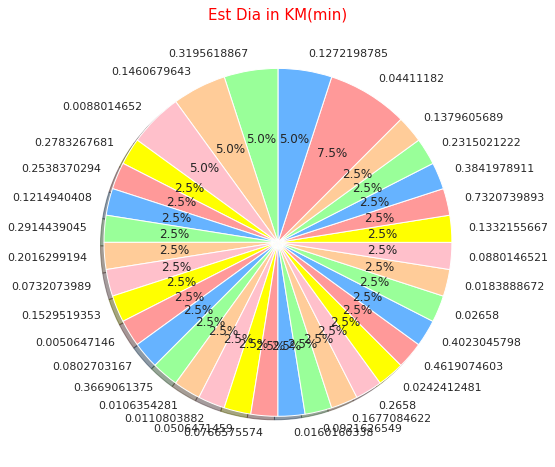

In [125]:
labels = df["Est Dia in KM(min)"][:40].value_counts().index
sizes = df["Est Dia in KM(min)"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Est Dia in KM(min)',color = 'red',fontsize = 15)
plt.show()

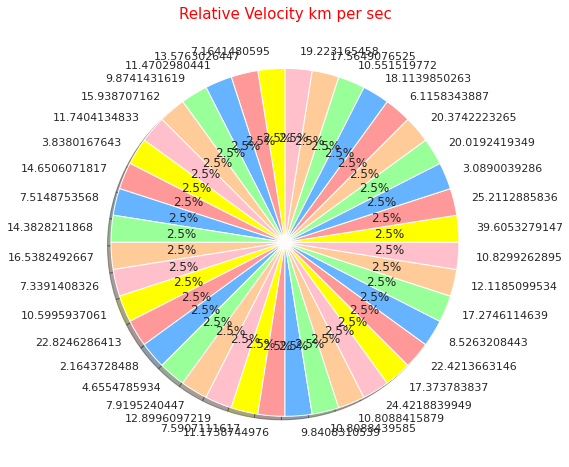

In [126]:
labels = df["Relative Velocity km per sec"][:40].value_counts().index
sizes = df["Relative Velocity km per sec"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Relative Velocity km per sec',color = 'red',fontsize = 15)
plt.show()

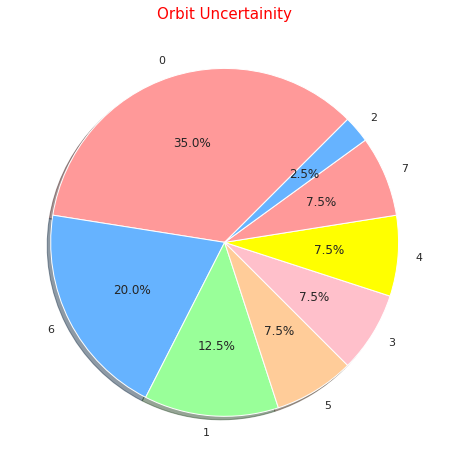

In [127]:
labels = df["Orbit Uncertainity"][:40].value_counts().index
sizes = df["Orbit Uncertainity"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Orbit Uncertainity',color = 'red',fontsize = 15)
plt.show()

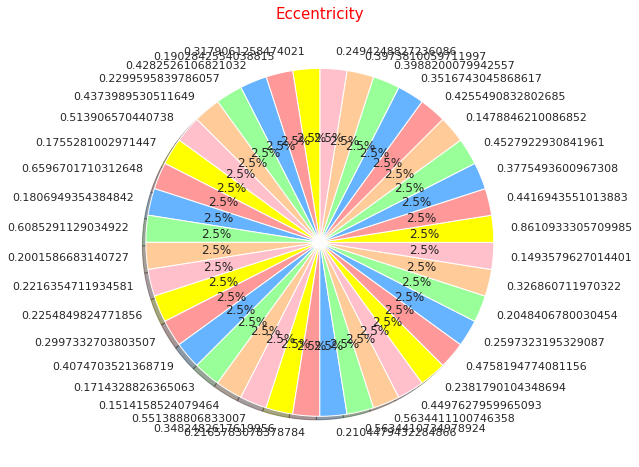

In [128]:
labels = df["Eccentricity"][:40].value_counts().index
sizes = df["Eccentricity"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Eccentricity',color = 'red',fontsize = 15)
plt.show()

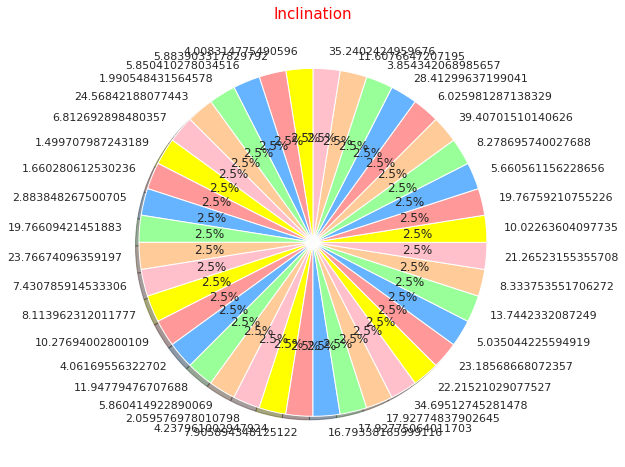

In [129]:
labels = df["Inclination"][:40].value_counts().index
sizes = df["Inclination"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Inclination',color = 'red',fontsize = 15)
plt.show()

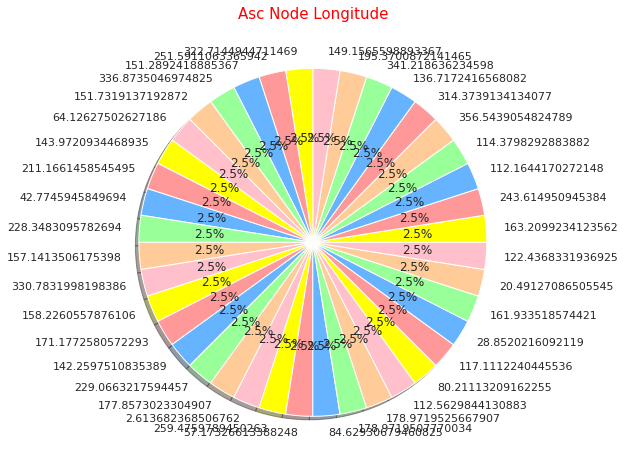

In [130]:
labels = df["Asc Node Longitude"][:40].value_counts().index
sizes = df["Asc Node Longitude"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Asc Node Longitude',color = 'red',fontsize = 15)
plt.show()

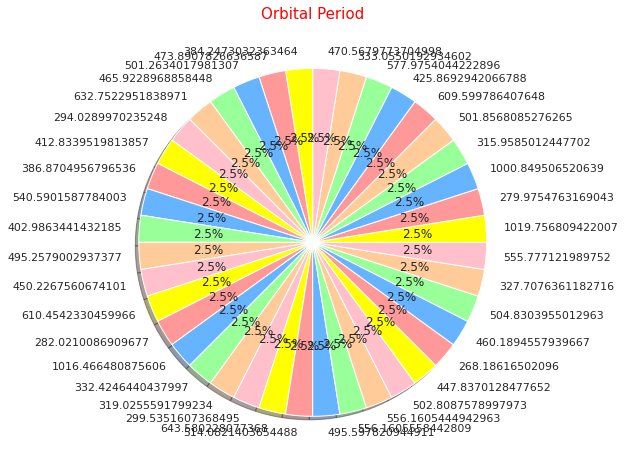

In [131]:
labels = df["Orbital Period"][:40].value_counts().index
sizes = df["Orbital Period"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Orbital Period',color = 'red',fontsize = 15)
plt.show()

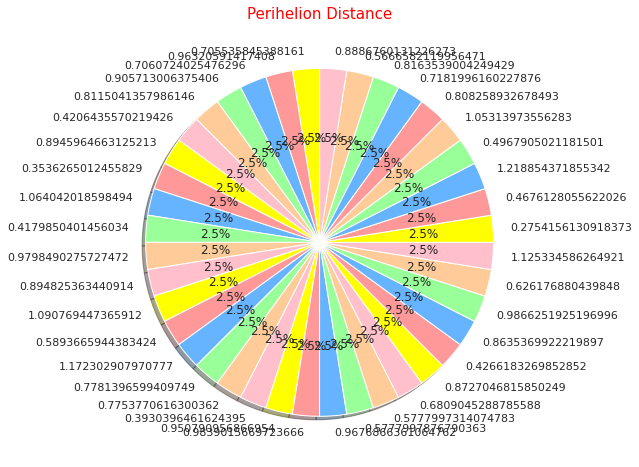

In [132]:
labels = df["Perihelion Distance"][:40].value_counts().index
sizes = df["Perihelion Distance"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Perihelion Distance',color = 'red',fontsize = 15)
plt.show()  

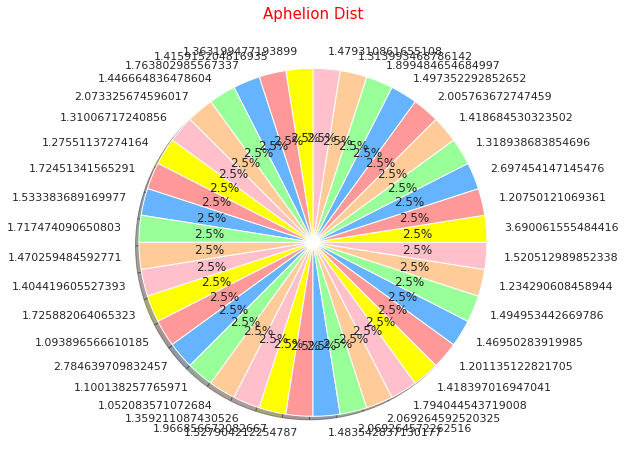

In [133]:
labels = df["Aphelion Dist"][:40].value_counts().index
sizes = df["Aphelion Dist"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Aphelion Dist',color = 'red',fontsize = 15)
plt.show()

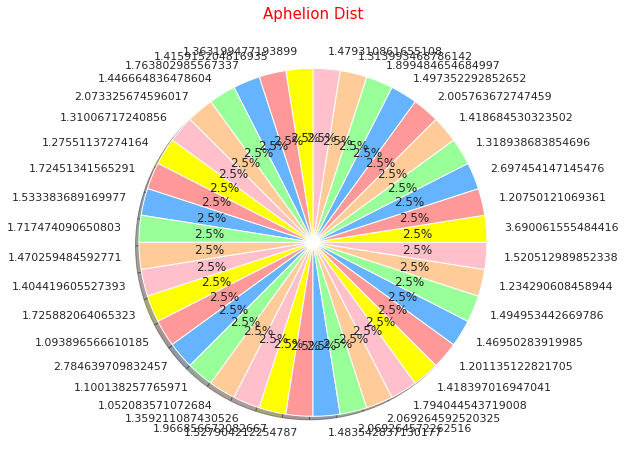

In [134]:
labels = df["Aphelion Dist"][:40].value_counts().index
sizes = df["Aphelion Dist"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Aphelion Dist',color = 'red',fontsize = 15)
plt.show()

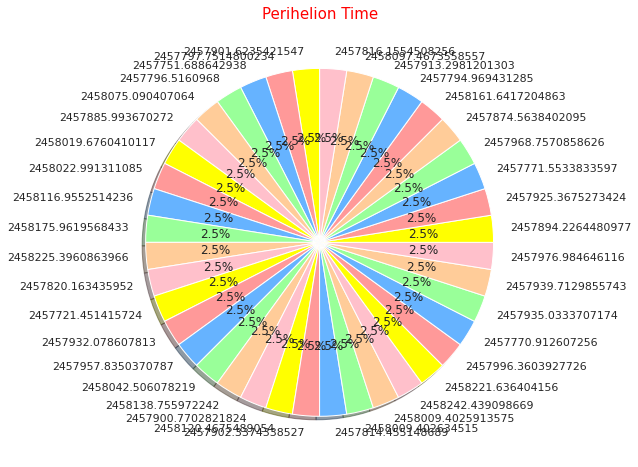

In [135]:
labels = df["Perihelion Time"][:40].value_counts().index
sizes = df["Perihelion Time"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Perihelion Time',color = 'red',fontsize = 15)
plt.show()

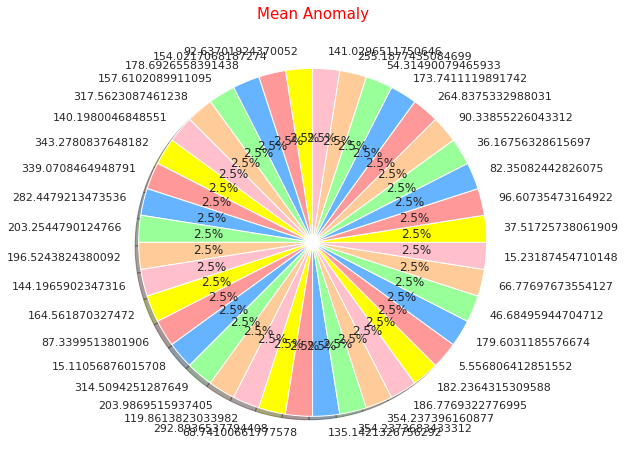

In [136]:
labels = df["Mean Anomaly"][:40].value_counts().index
sizes = df["Mean Anomaly"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Mean Anomaly',color = 'red',fontsize = 15)
plt.show()

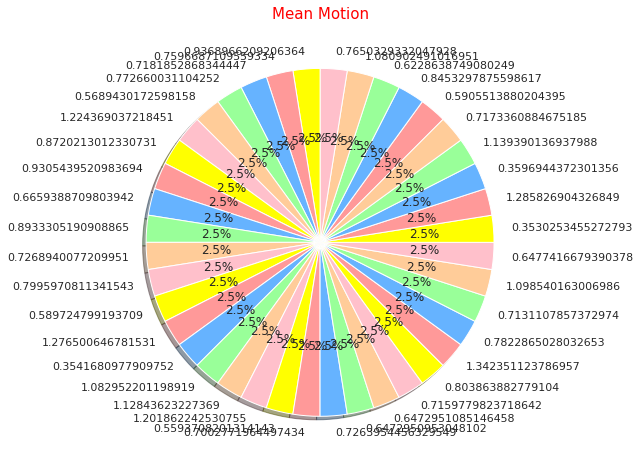

In [137]:
labels = df["Mean Motion"][:40].value_counts().index
sizes = df["Mean Motion"][:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
plt.title('Mean Motion',color = 'red',fontsize = 15)
plt.show()

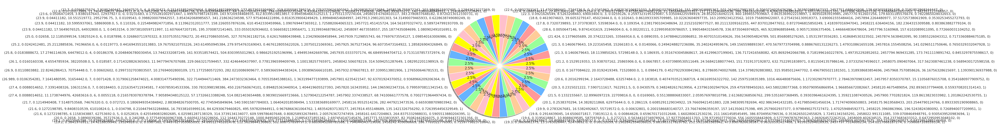

In [138]:
labels = df[:40].value_counts().index
sizes = df[:40].value_counts()
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99',"pink","yellow"]
plt.figure(figsize = (8,8))
plt.pie(sizes, labels=labels, rotatelabels=False, autopct='%1.1f%%',colors=colors,shadow=True, startangle=45)
#plt.title('Absolute Magnitude',color = 'red',fontsize = 15)
plt.show()

In [22]:
from scipy.stats import zscore
zf=df
zf.apply(zscore)
zf

,Absolute Magnitude,Est Dia in KM(min),Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,hazardous
0,21.600,0.127220,6.115834,6.275369e+07,17,5,0.025282,4.634,2458000.5,0.425549,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,1
1,21.300,0.146068,18.113985,5.729815e+07,21,3,0.186935,5.457,2458000.5,0.351674,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,0
2,20.300,0.231502,7.590711,7.622912e+06,22,0,0.043058,4.557,2458000.5,0.348248,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,1
3,27.400,0.008801,11.173874,4.268362e+07,7,6,0.005512,5.093,2458000.5,0.216578,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,0
4,21.600,0.127220,9.840831,6.101082e+07,25,1,0.034798,5.154,2458000.5,0.210448,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4682,23.900,0.044112,22.154265,6.187511e+06,4,8,0.019777,5.156,2457637.5,0.361512,39.880491,164.183305,457.179984,0.741558,276.395697,1.581299,2.457708e+06,304.306025,0.787436,0
4683,28.200,0.006089,3.225150,9.677324e+05,2,6,0.006451,5.742,2458000.5,0.073200,5.360249,345.225230,407.185767,0.996434,42.111064,1.153835,2.458088e+06,282.978786,0.884117,0
4684,22.700,0.076658,7.191642,9.126775e+06,17,6,0.059972,4.410,2458000.5,0.368055,4.405467,37.026468,690.054279,0.965760,274.692712,2.090708,2.458300e+06,203.501147,0.521698,0
4685,21.800,0.116026,11.352090,3.900908e+07,6,5,0.177510,4.477,2458000.5,0.202565,21.080244,163.802910,662.048343,1.185467,180.346090,1.787733,2.458288e+06,203.524965,0.543767,0


In [23]:
df.columns

Index(['Absolute Magnitude', 'Est Dia in KM(min)',
       'Relative Velocity km per sec', 'Miss Dist.(kilometers)', 'Orbit ID',
       'Orbit Uncertainity', 'Minimum Orbit Intersection',
       'Jupiter Tisserand Invariant', 'Epoch Osculation', 'Eccentricity',
       'Inclination', 'Asc Node Longitude', 'Orbital Period',
       'Perihelion Distance', 'Perihelion Arg', 'Aphelion Dist',
       'Perihelion Time', 'Mean Anomaly', 'Mean Motion', 'hazardous'],
      dtype='object')

In [24]:
df=df.drop(['Orbit ID', 'Jupiter Tisserand Invariant','Epoch Osculation','Perihelion Arg'],axis=1)

In [100]:
df.columns

Index(['Absolute Magnitude', 'Est Dia in KM(min)',
       'Relative Velocity km per sec', 'Miss Dist.(kilometers)',
       'Orbit Uncertainity', 'Minimum Orbit Intersection', 'Eccentricity',
       'Inclination', 'Asc Node Longitude', 'Orbital Period',
       'Perihelion Distance', 'Aphelion Dist', 'Perihelion Time',
       'Mean Anomaly', 'Mean Motion', 'hazardous'],
      dtype='object')

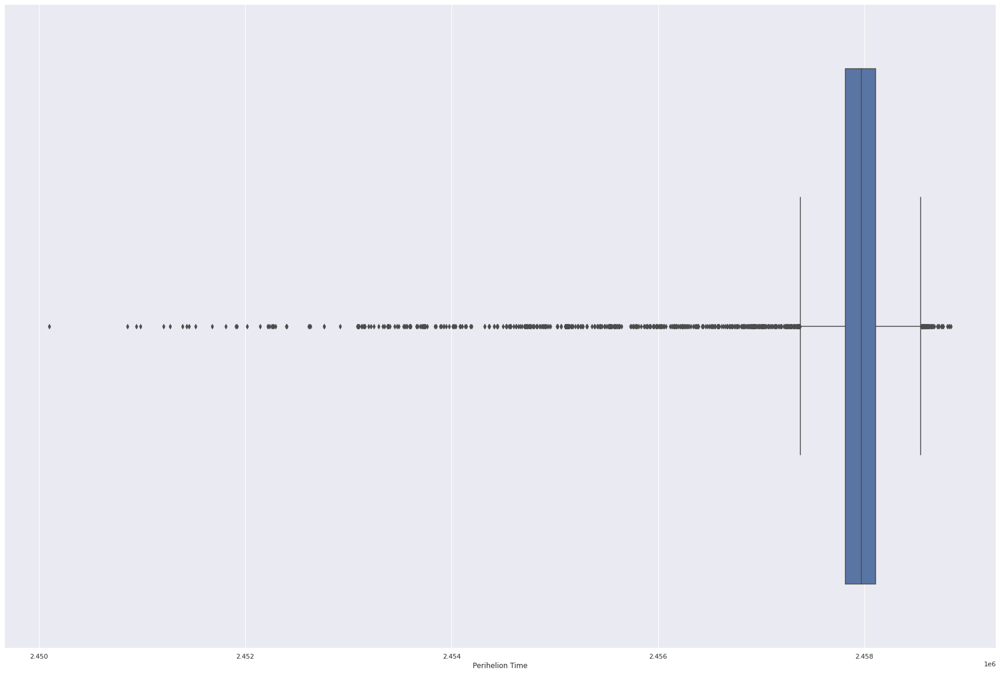

In [25]:
  sns.boxplot(x=df['Perihelion Time'])

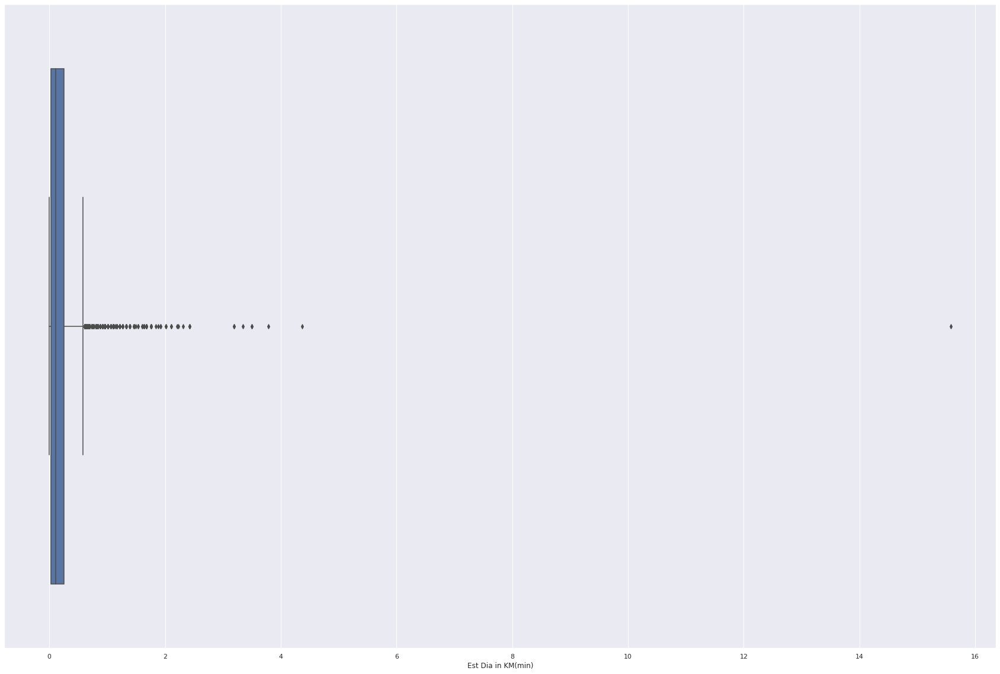

In [26]:
sns.boxplot(x=df['Est Dia in KM(min)'])

In [28]:
from scipy import stats
import numpy as np
 
z = np.abs(stats.zscore(df))
print(z)

      Absolute Magnitude  Est Dia in KM(min)  Relative Velocity km per sec  \
0               0.231042            0.209411                      1.077139   
1               0.334824            0.158406                      0.568146   
2               0.680766            0.072789                      0.874892   
3               1.775418            0.529864                      0.383539   
4               0.231042            0.209411                      0.566337   
...                  ...                 ...                           ...   
4682            0.564623            0.434310                      1.122183   
4683            2.052171            0.537204                      1.473533   
4684            0.149493            0.346238                      0.929615   
4685            0.161854            0.239703                      0.359101   
4686            1.092782            0.530496                      3.013536   

      Miss Dist.(kilometers)  Orbit Uncertainity  Minimum Orbit

In [29]:
Q1 = np.percentile(df, 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(df, 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1

print(IQR)


print("Old Shape: ", df.shape)

dtemp=df.copy()

dtemp

177.7644921581301
Old Shape:  (4687, 16)


,Absolute Magnitude,Est Dia in KM(min),Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,hazardous
0,21.600,0.127220,6.115834,6.275369e+07,5,0.025282,0.425549,6.025981,314.373913,609.599786,0.808259,2.005764,2.458162e+06,264.837533,0.590551,1
1,21.300,0.146068,18.113985,5.729815e+07,3,0.186935,0.351674,28.412996,136.717242,425.869294,0.718200,1.497352,2.457795e+06,173.741112,0.845330,0
2,20.300,0.231502,7.590711,7.622912e+06,0,0.043058,0.348248,4.237961,259.475979,643.580228,0.950791,1.966857,2.458120e+06,292.893654,0.559371,1
3,27.400,0.008801,11.173874,4.268362e+07,6,0.005512,0.216578,7.905894,57.173266,514.082140,0.983902,1.527904,2.457902e+06,68.741007,0.700277,0
4,21.600,0.127220,9.840831,6.101082e+07,1,0.034798,0.210448,16.793382,84.629307,495.597821,0.967687,1.483543,2.457814e+06,135.142133,0.726395,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4682,23.900,0.044112,22.154265,6.187511e+06,8,0.019777,0.361512,39.880491,164.183305,457.179984,0.741558,1.581299,2.457708e+06,304.306025,0.787436,0
4683,28.200,0.006089,3.225150,9.677324e+05,6,0.006451,0.073200,5.360249,345.225230,407.185767,0.996434,1.153835,2.458088e+06,282.978786,0.884117,0
4684,22.700,0.076658,7.191642,9.126775e+06,6,0.059972,0.368055,4.405467,37.026468,690.054279,0.965760,2.090708,2.458300e+06,203.501147,0.521698,0
4685,21.800,0.116026,11.352090,3.900908e+07,5,0.177510,0.202565,21.080244,163.802910,662.048343,1.185467,1.787733,2.458288e+06,203.524965,0.543767,0


In [30]:
Q1 = np.percentile(dtemp['Perihelion Time'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(dtemp['Perihelion Time'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1
 
print("Old Shape: ", dtemp.shape)
 
# Upper bound
upper = np.where(dtemp['Perihelion Time'] >= (Q3+1.5*IQR))
# Lower bound
lower = np.where(dtemp['Perihelion Time'] <= (Q1-1.5*IQR))
 
''' Removing the Outliers '''
dtemp.drop(upper[0], inplace = True)
dtemp.drop(lower[0], inplace = True)
 
print("New Shape: ", dtemp.shape)

df=dtemp.copy()

Old Shape:  (4687, 16)
New Shape:  (4134, 16)


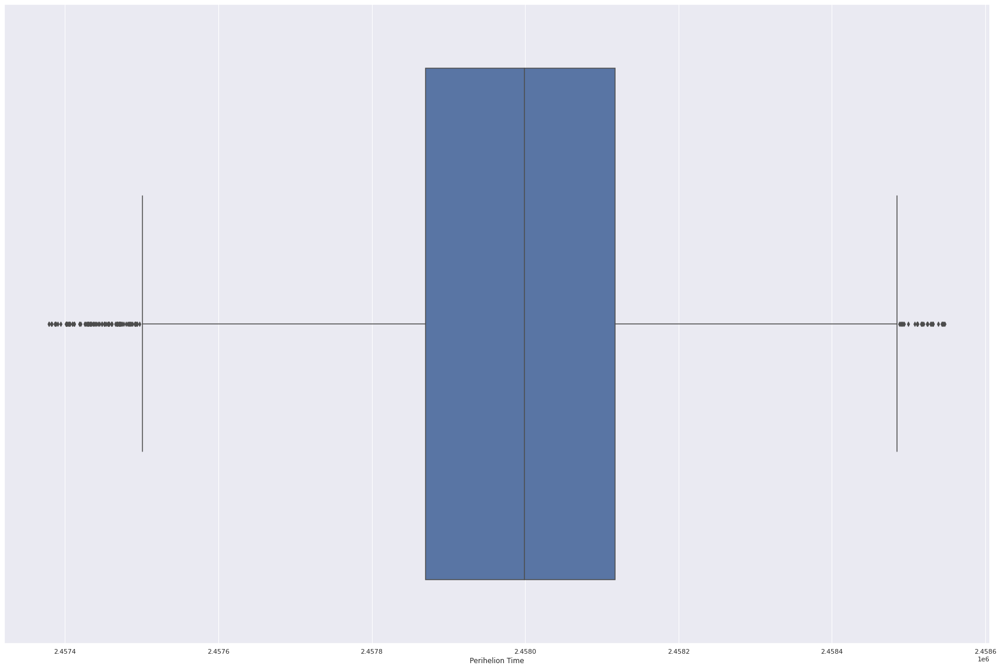

In [109]:
sns.boxplot(x=df['Perihelion Time'])    

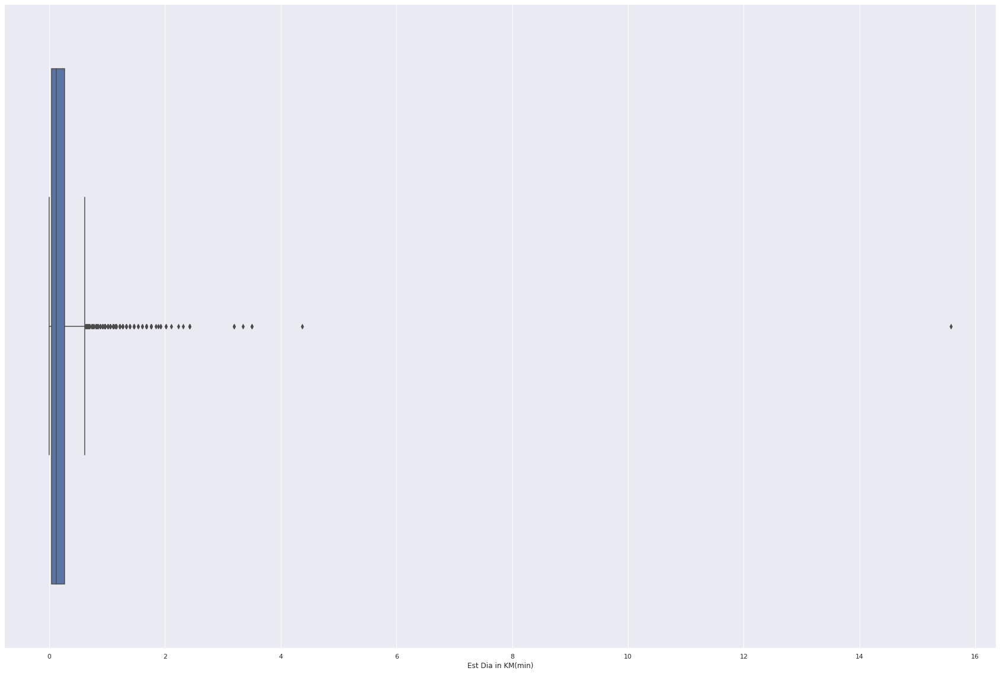

In [32]:
sns.boxplot(x=df['Est Dia in KM(min)'])

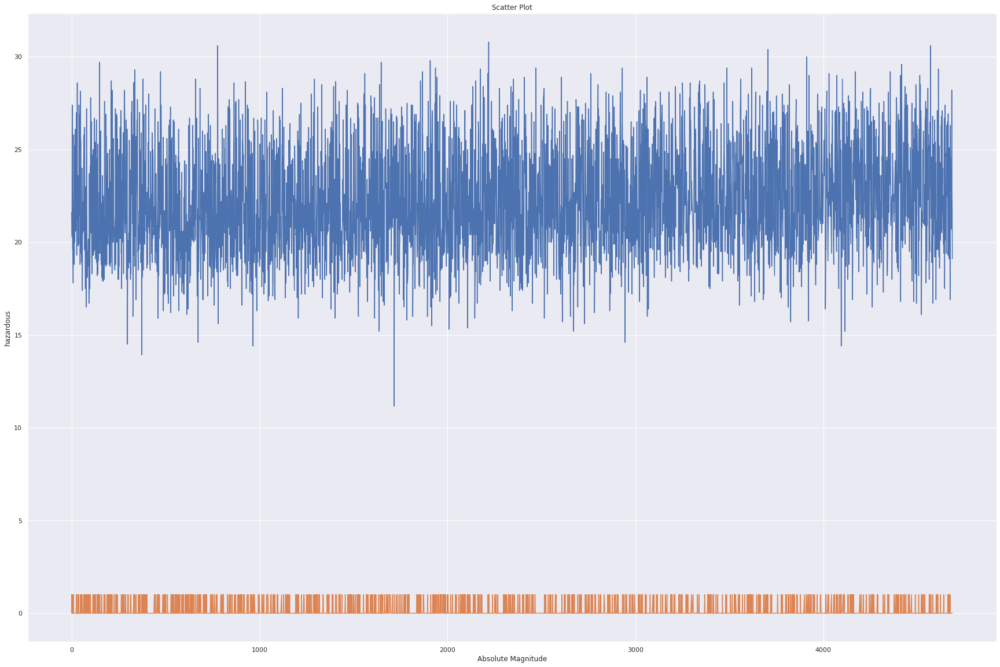

In [65]:
plt.plot(df['Absolute Magnitude'])

plt.plot(df['hazardous'])
 
# Adding Title to the Plot

plt.title("Scatter Plot")
 
# Setting the X and Y labels

plt.xlabel('Absolute Magnitude')

plt.ylabel('hazardous')
 
plt.show()

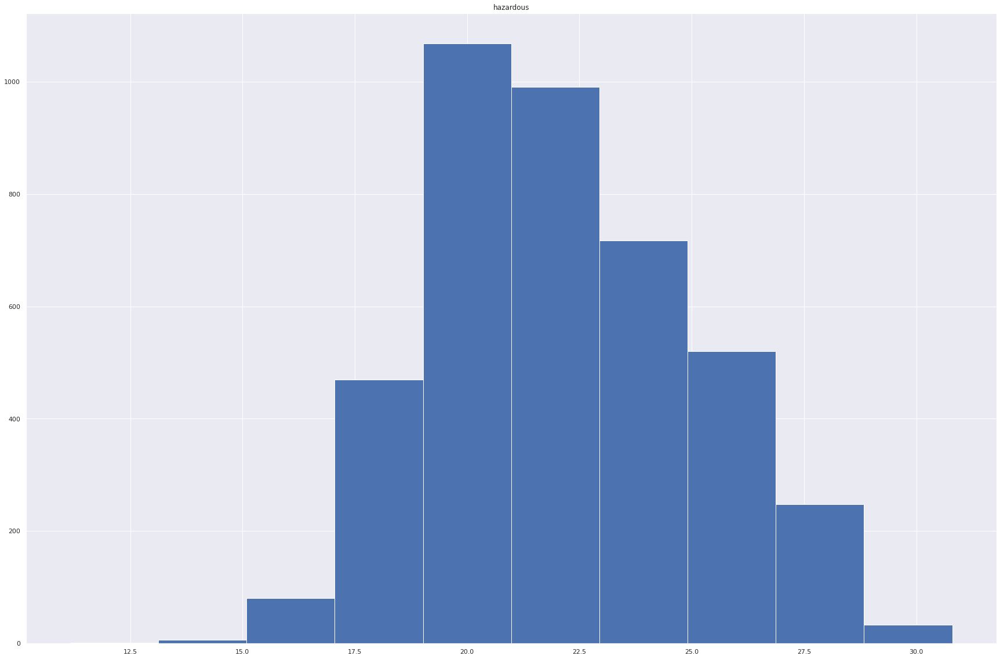

In [73]:
plt.hist(df['Absolute Magnitude'])
plt.title("hazardous")
plt.show()

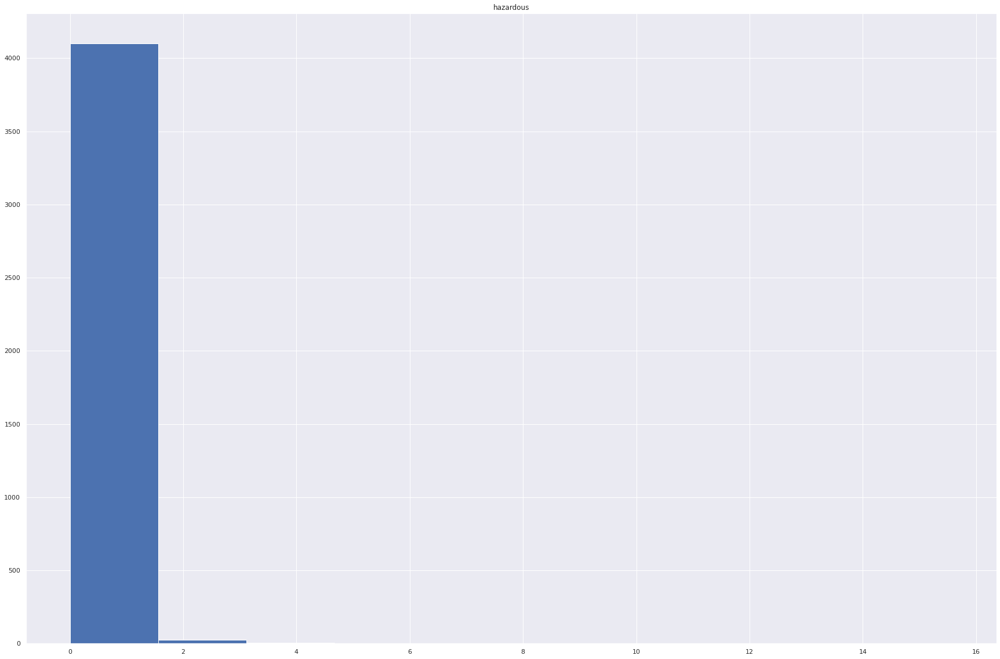

In [89]:
plt.hist(df['Est Dia in KM(min)'])
plt.title("hazardous")
plt.show()

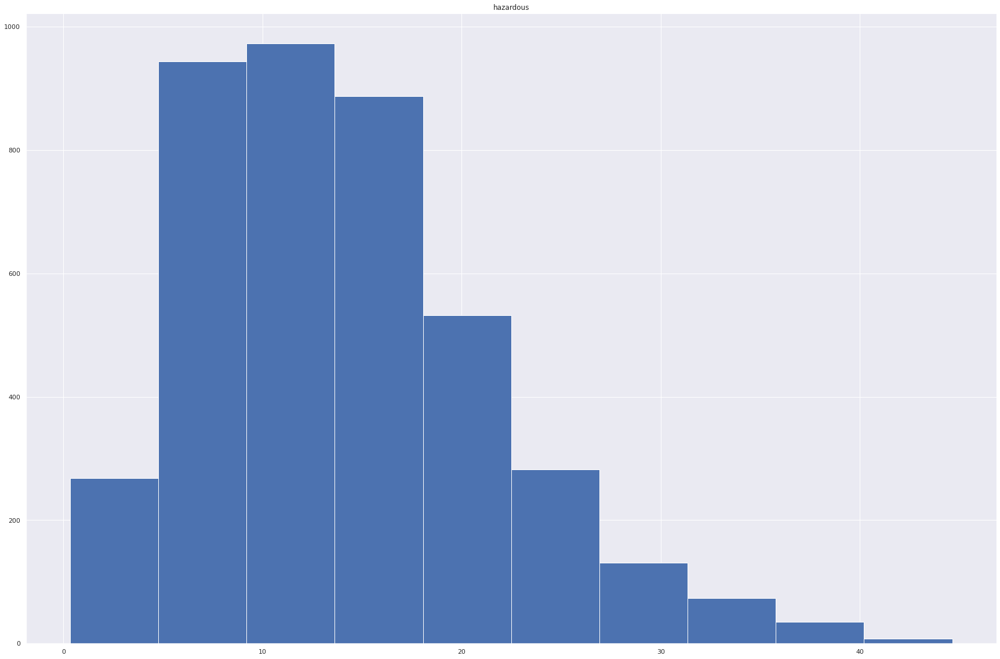

In [90]:
plt.hist(df['Relative Velocity km per sec'])
plt.title("hazardous")
plt.show()

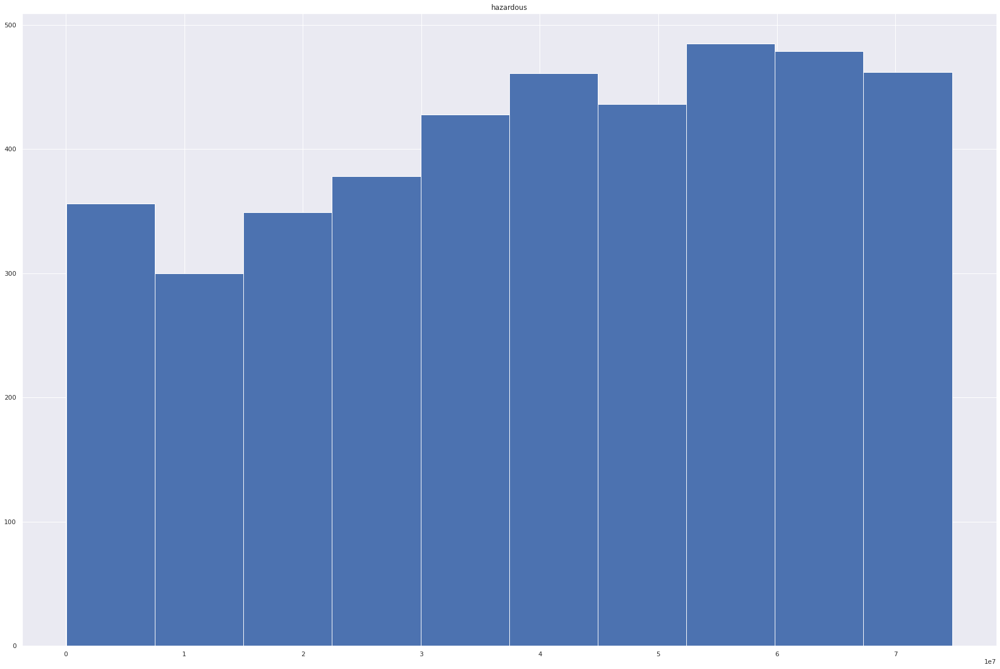

In [91]:
plt.hist(df['Miss Dist.(kilometers)'])
plt.title("hazardous")
plt.show()

In [ ]:
plt.hist(df['Orbit ID'])
plt.title("hazardous")
plt.show()

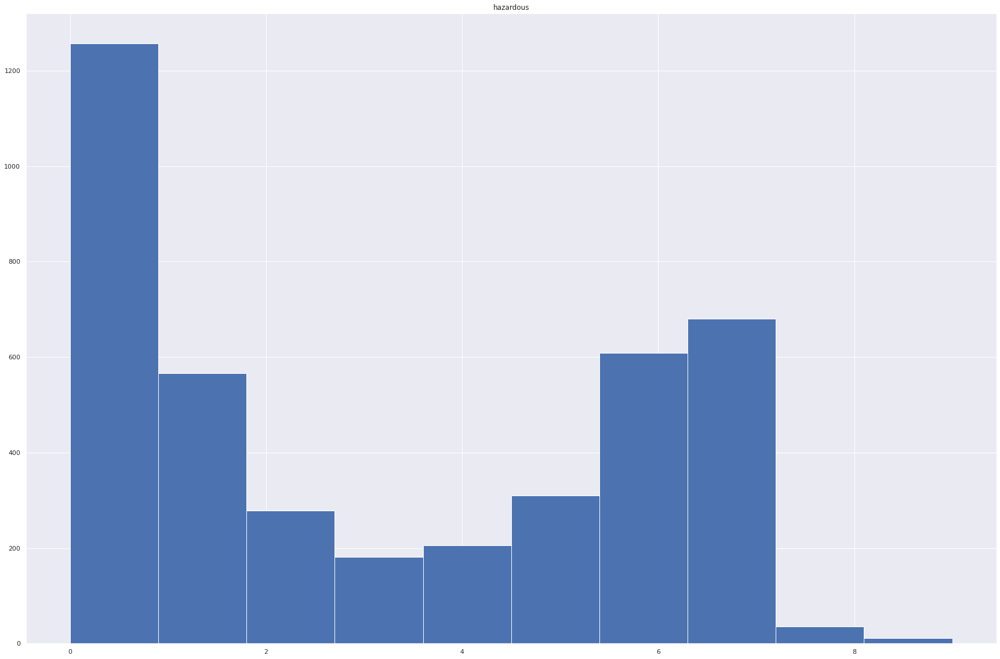

In [92]:
plt.hist(df['Orbit Uncertainity'])
plt.title("hazardous")
plt.show()

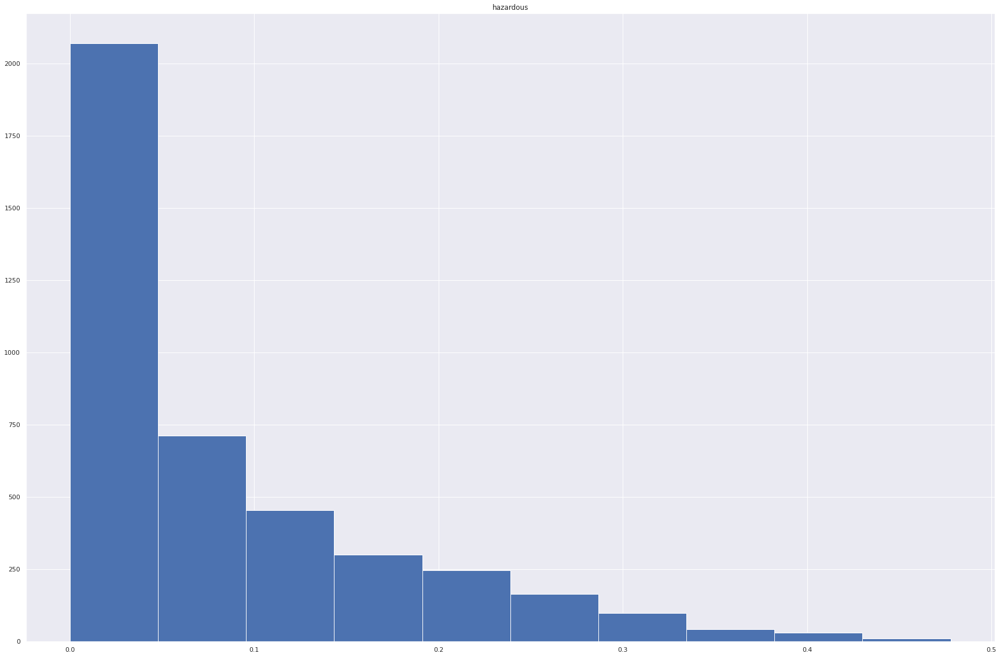

In [95]:
plt.hist(df['Minimum Orbit Intersection'])
plt.title("hazardous")
plt.show()

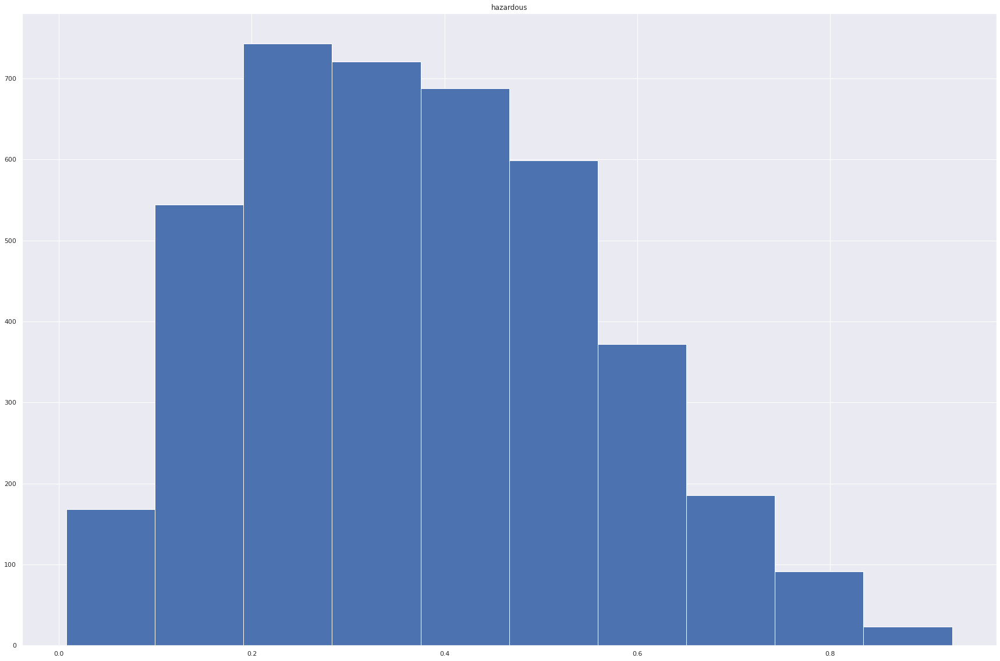

In [97]:
plt.hist(df['Eccentricity'])
plt.title("hazardous")
plt.show()

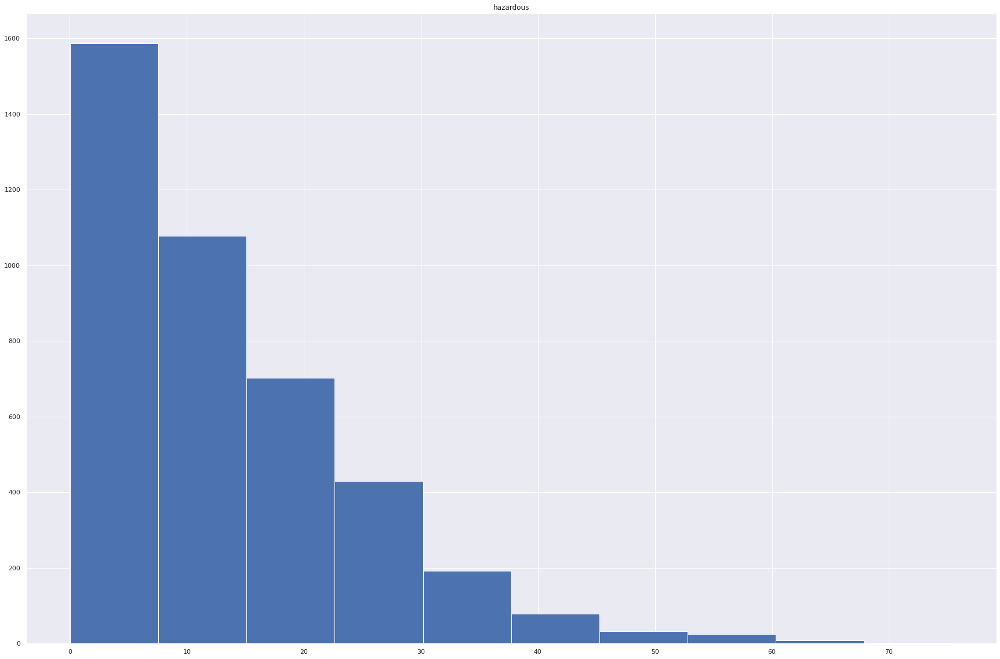

In [101]:
plt.hist(df['Inclination'])
plt.title("hazardous")
plt.show()

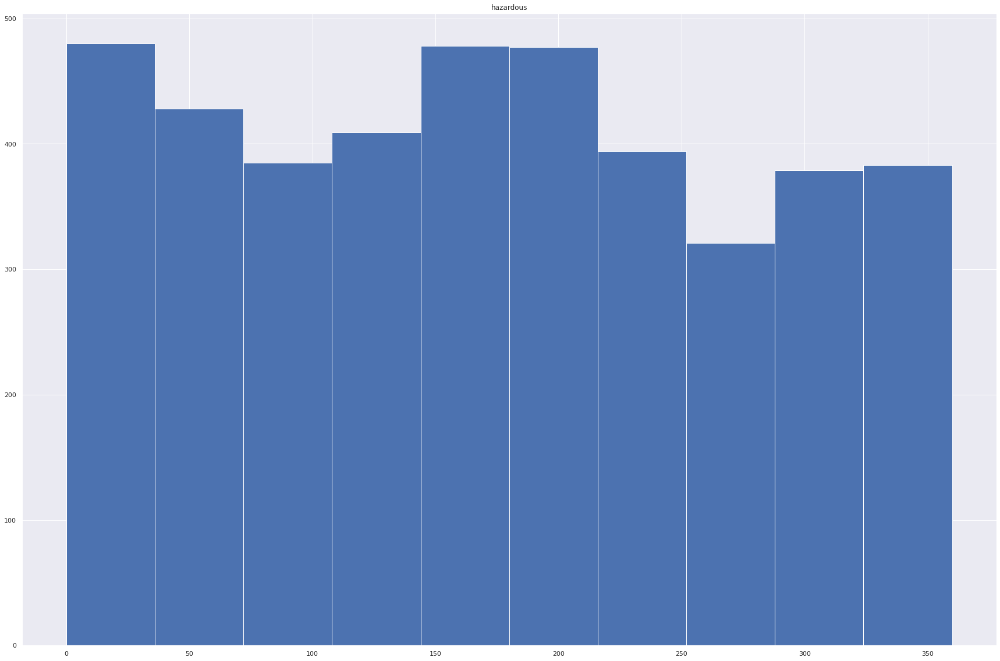

In [102]:
plt.hist(df['Asc Node Longitude'])
plt.title("hazardous")
plt.show()

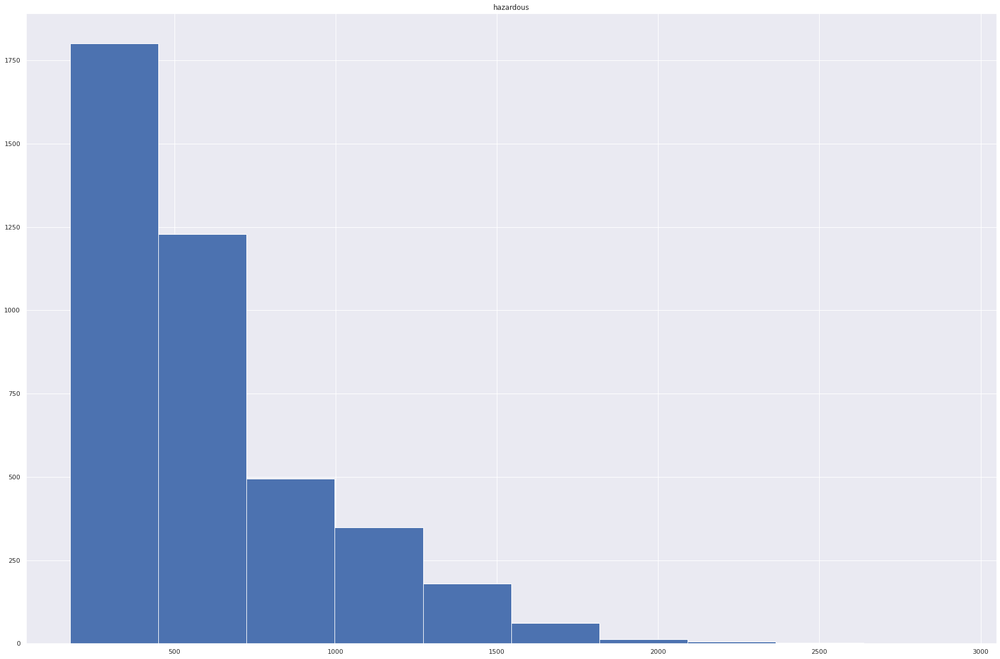

In [103]:
plt.hist(df['Orbital Period'])
plt.title("hazardous")
plt.show()

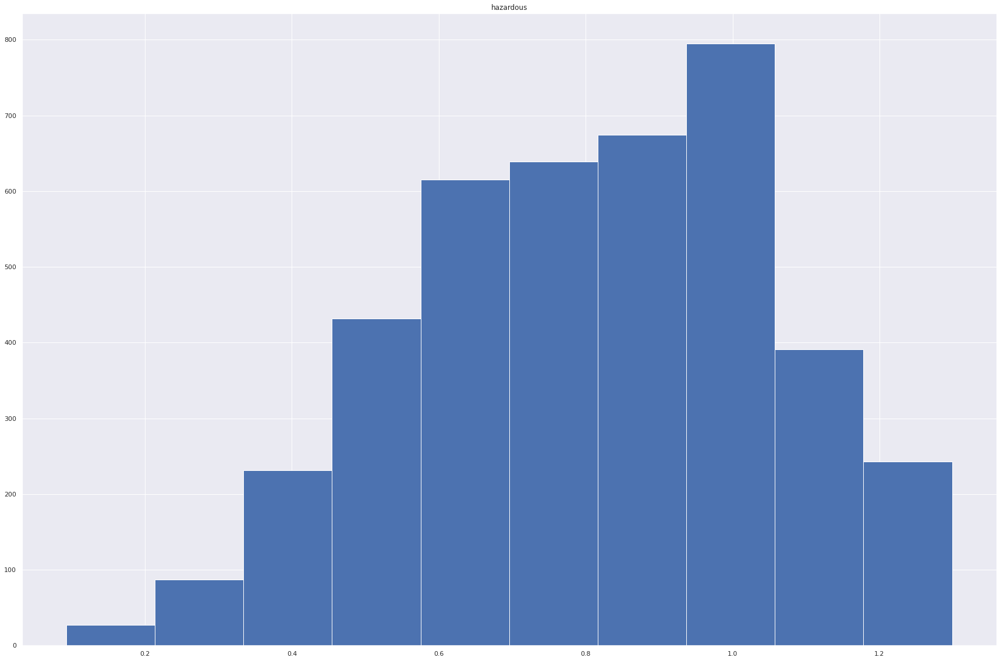

In [104]:
plt.hist(df['Perihelion Distance'])
plt.title("hazardous")
plt.show()

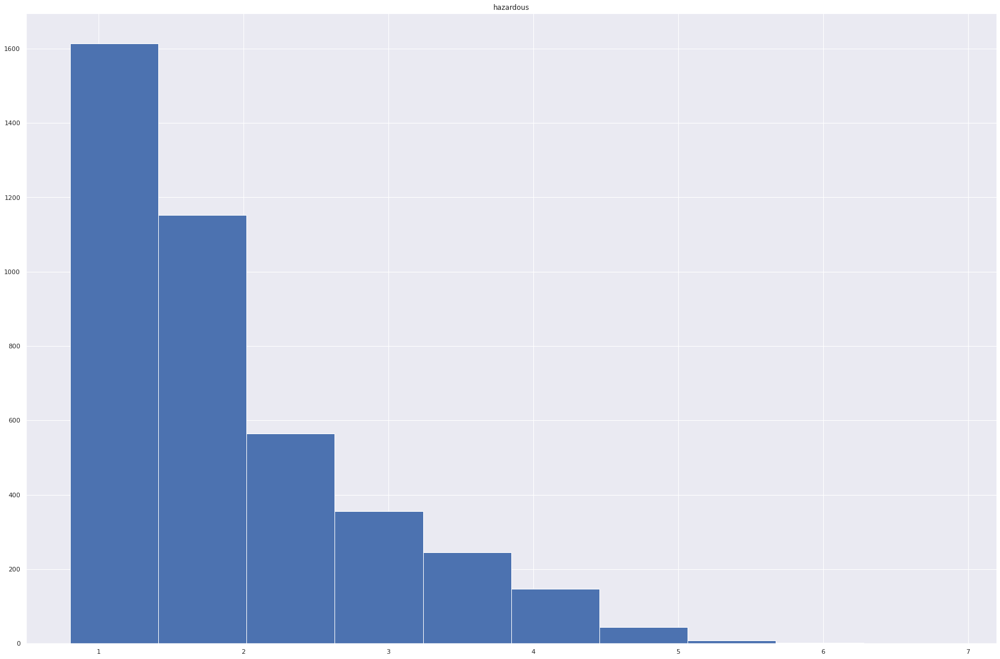

In [105]:
plt.hist(df['Aphelion Dist'])
plt.title("hazardous")
plt.show()

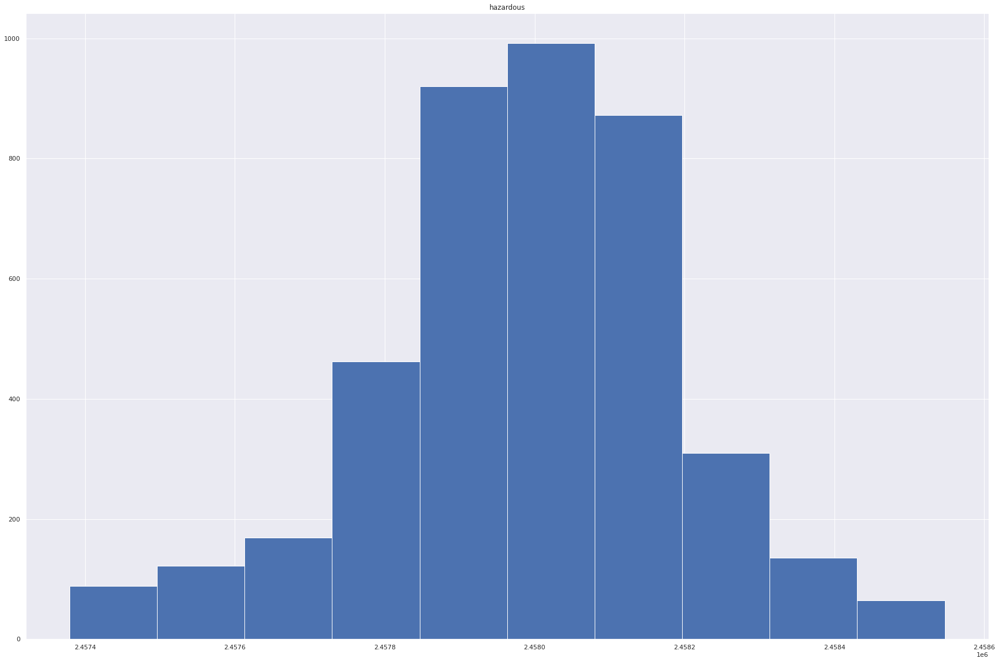

In [106]:
plt.hist(df['Perihelion Time'])
plt.title("hazardous")
plt.show()

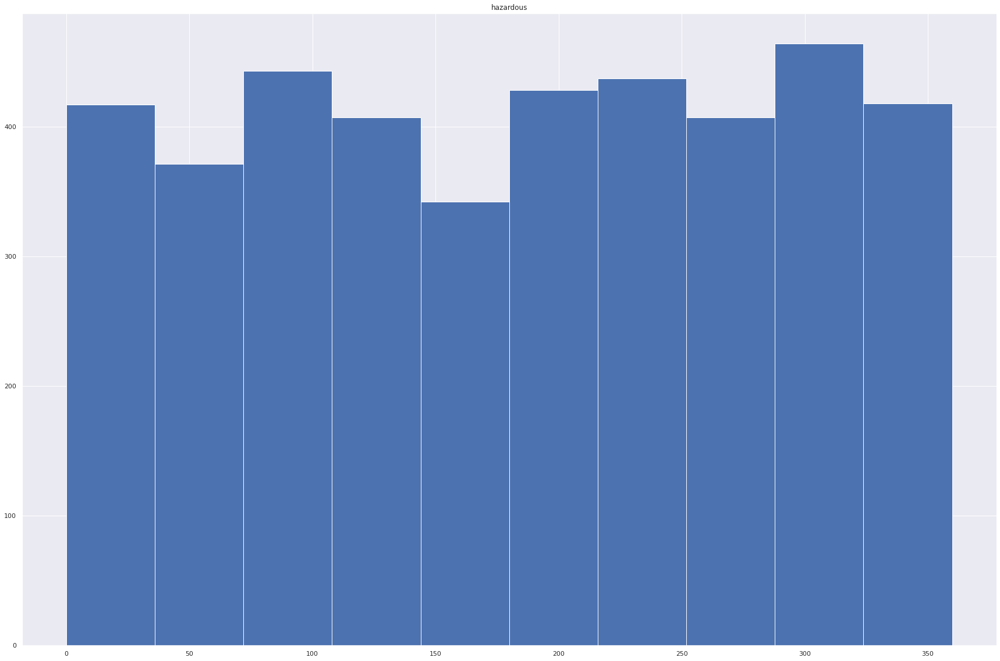

In [107]:
plt.hist(df['Mean Anomaly'])
plt.title("hazardous")
plt.show()

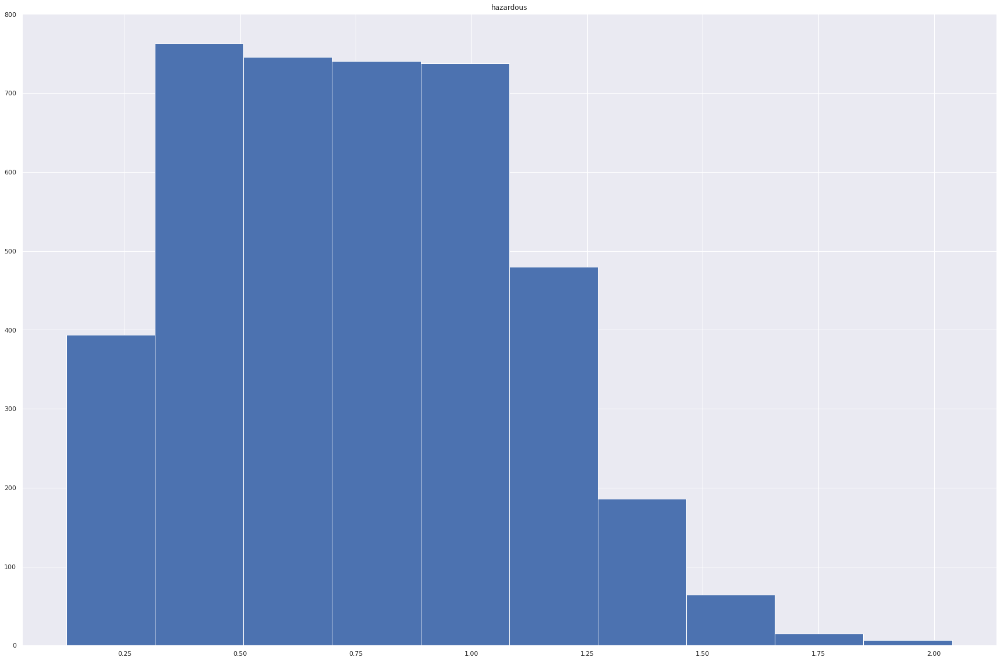

In [108]:
  plt.hist(df['Mean Motion'])
plt.title("hazardous")
plt.show()

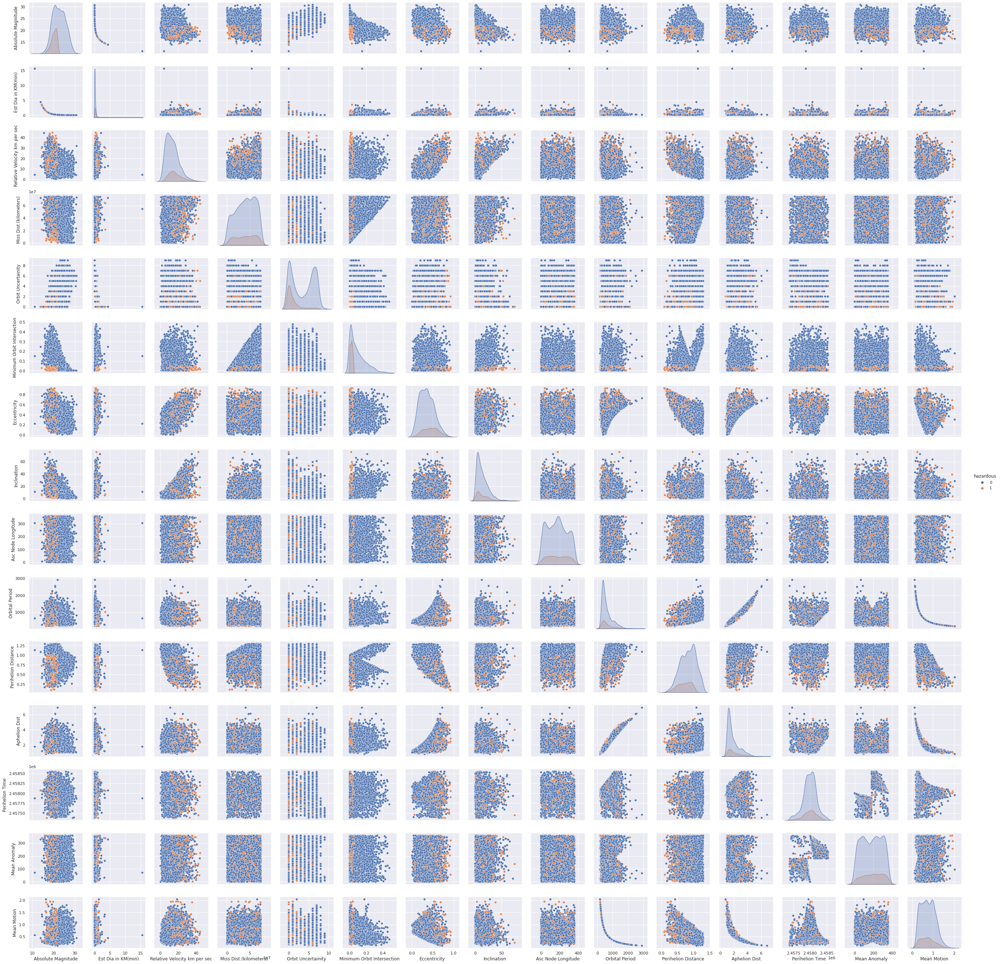

In [75]:
sns.pairplot(df,hue='hazardous')

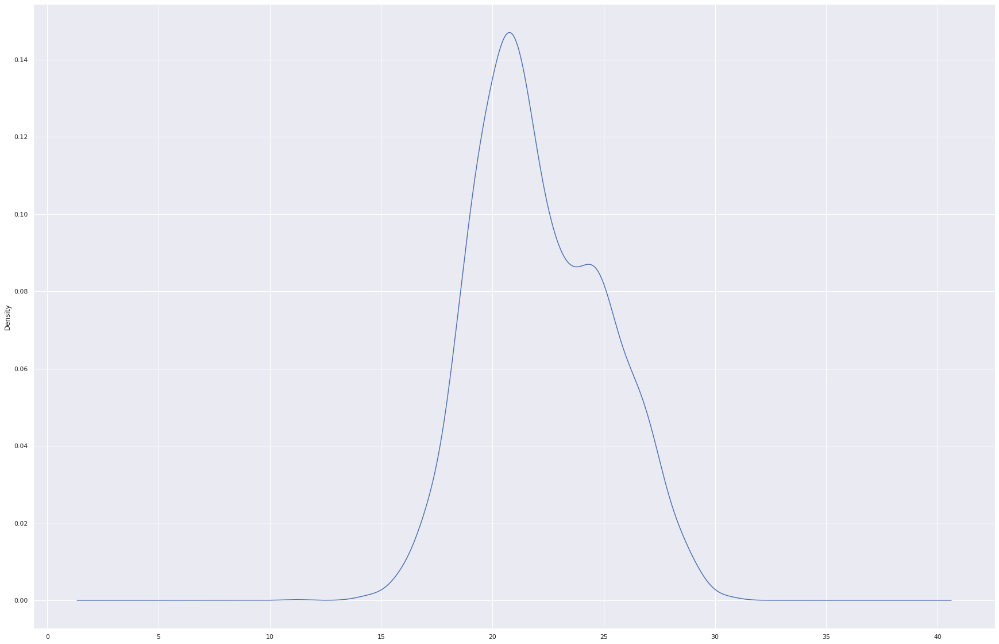

In [79]:
df['Absolute Magnitude'].plot.density()

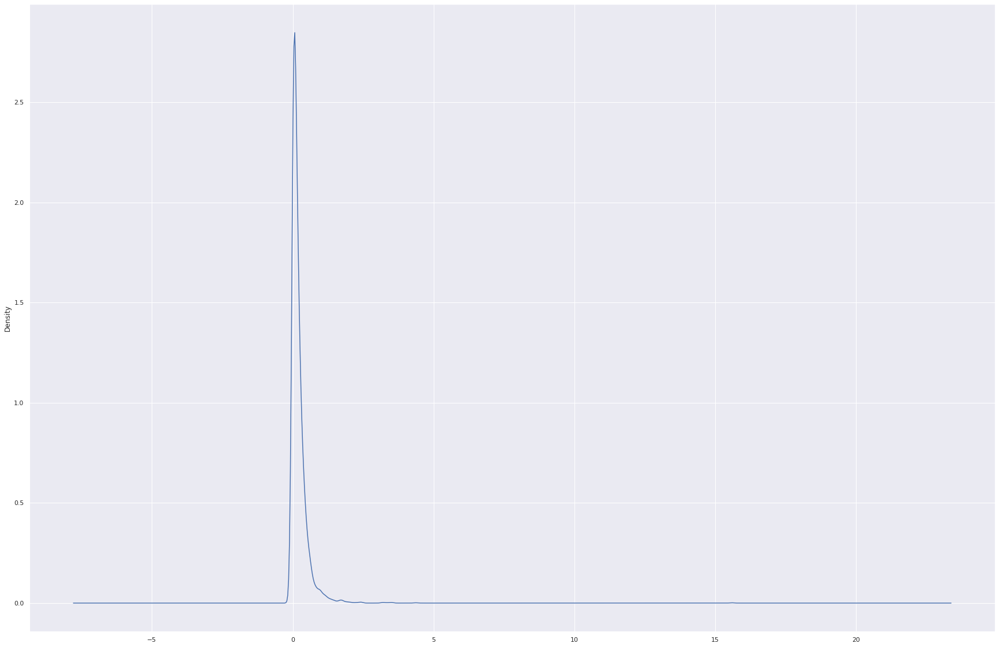

In [111]:
df['Est Dia in KM(min)'].plot.density()

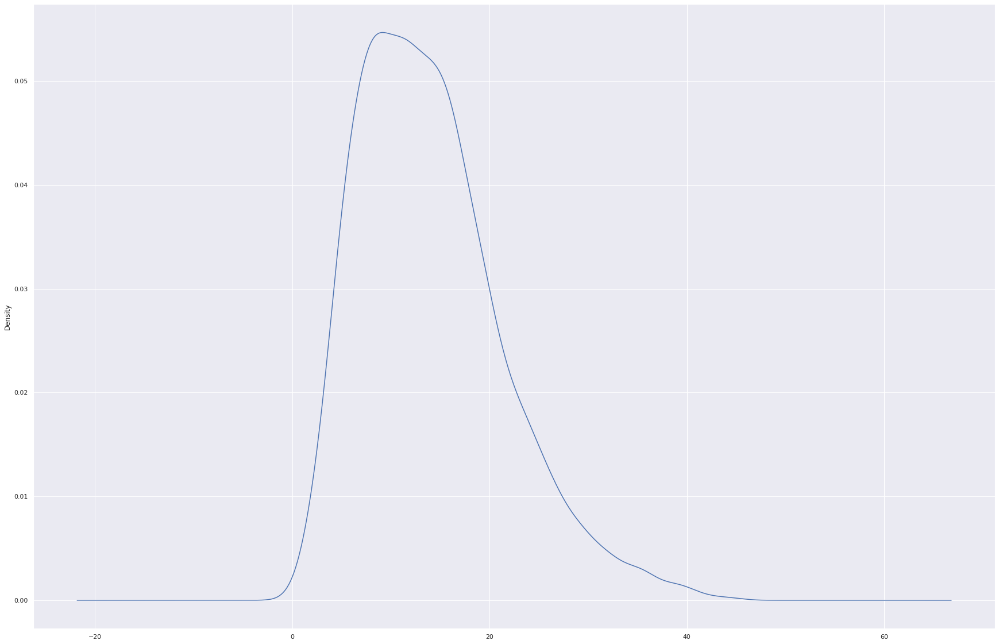

In [112]:
df['Relative Velocity km per sec'].plot.density()

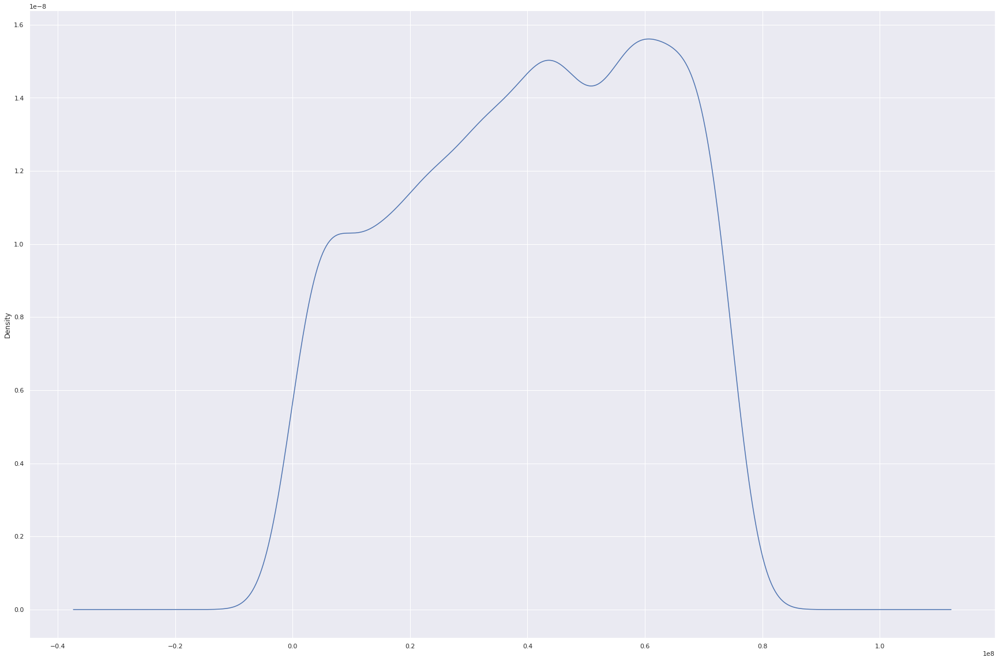

In [113]:
df['Miss Dist.(kilometers)'].plot.density()

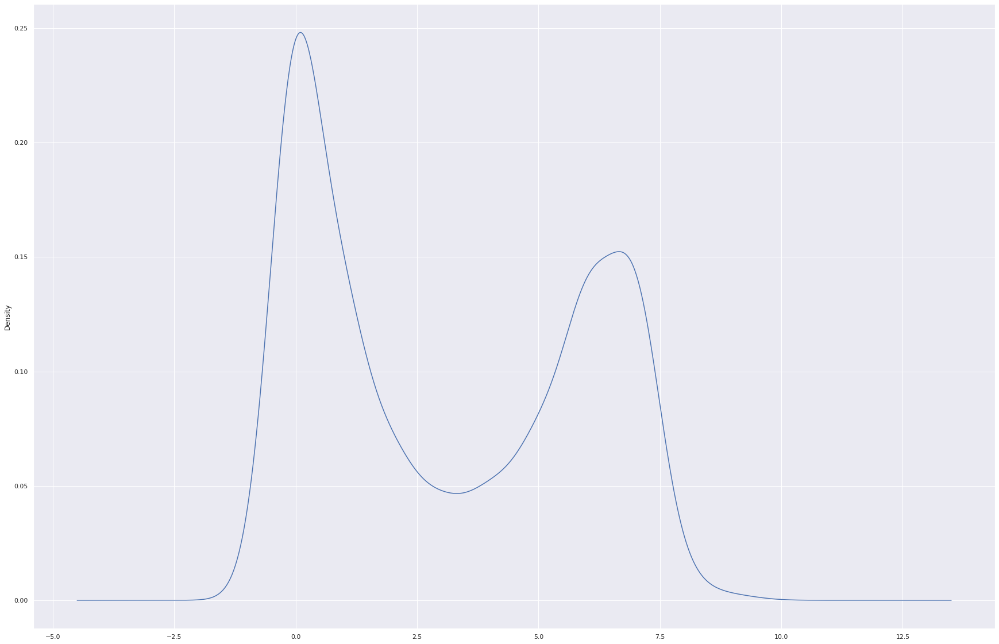

In [114]:
df['Orbit Uncertainity'].plot.density()

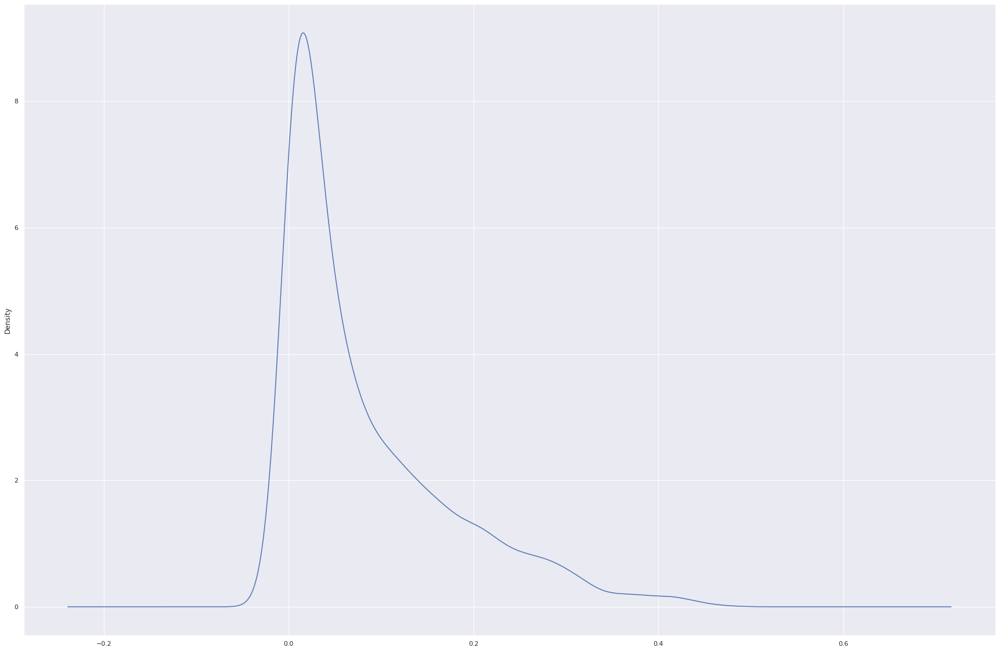

In [115]:
df['Minimum Orbit Intersection'].plot.density()

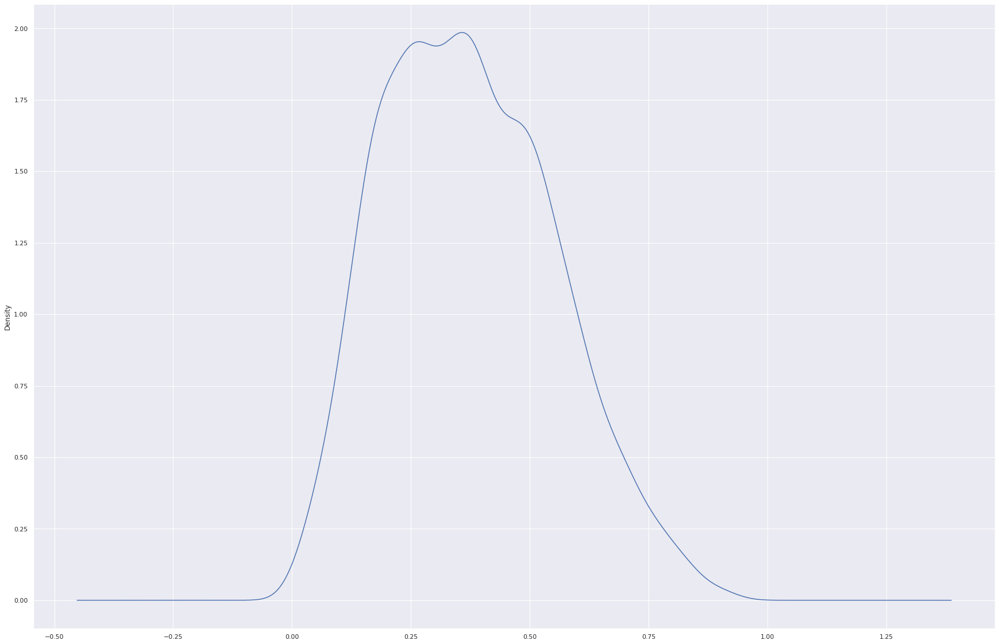

In [116]:
df['Eccentricity'].plot.density()

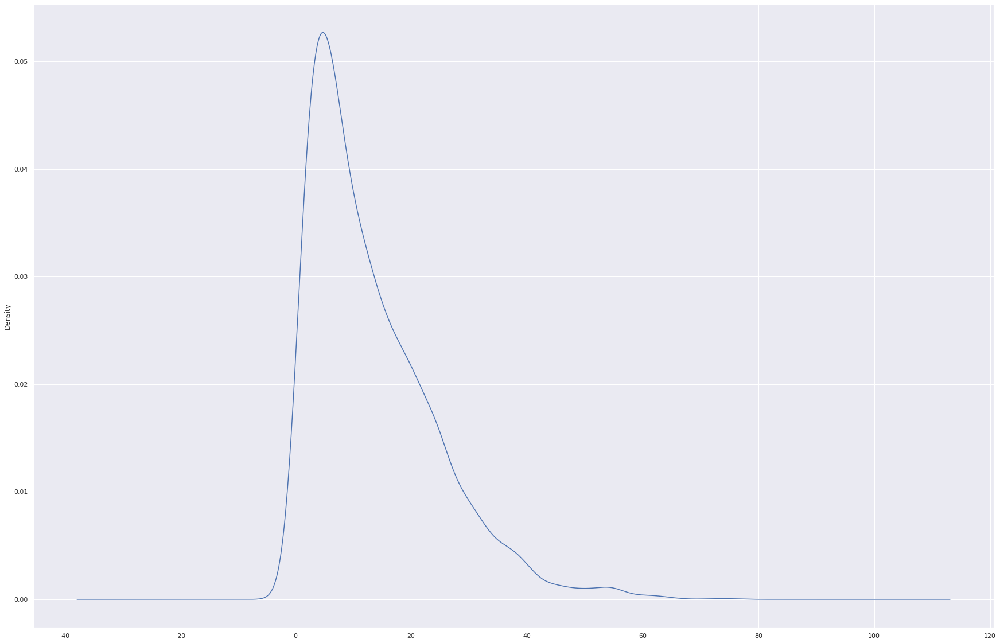

In [117]:
df['Inclination'].plot.density()

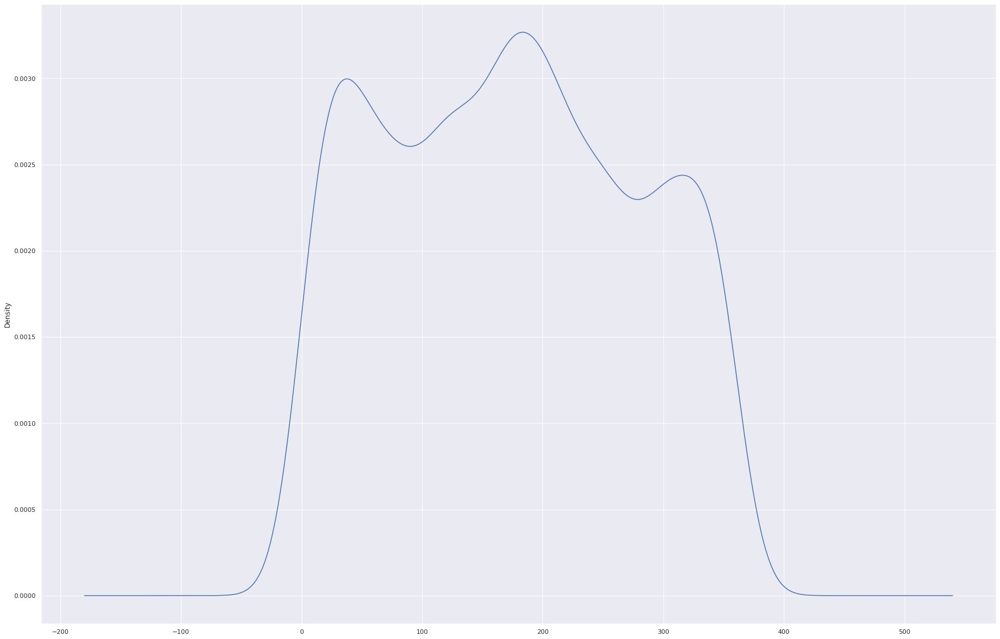

In [118]:
df['Asc Node Longitude'].plot.density()

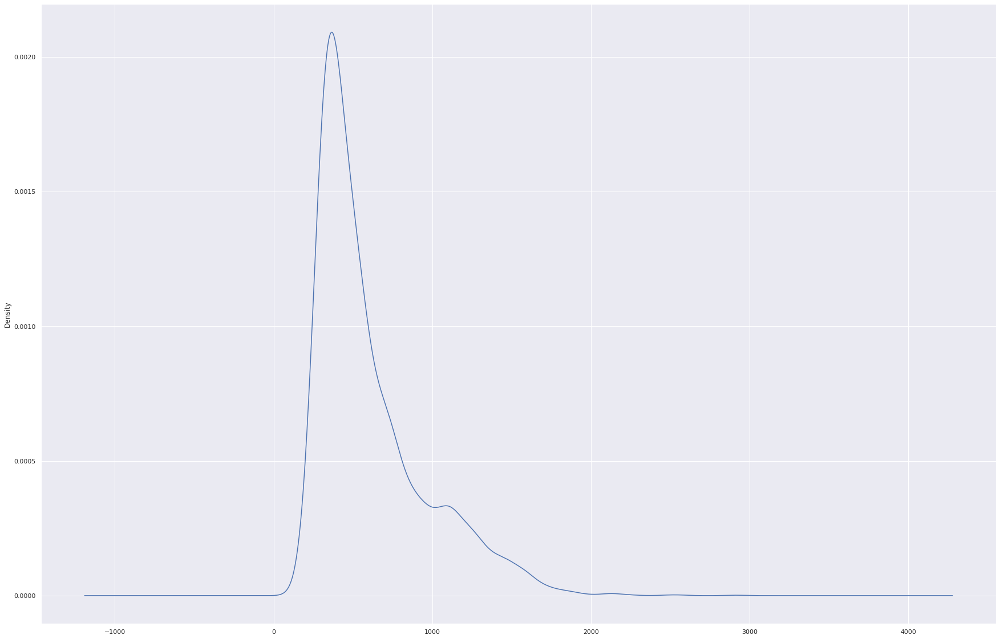

In [119]:
df['Orbital Period'].plot.density()

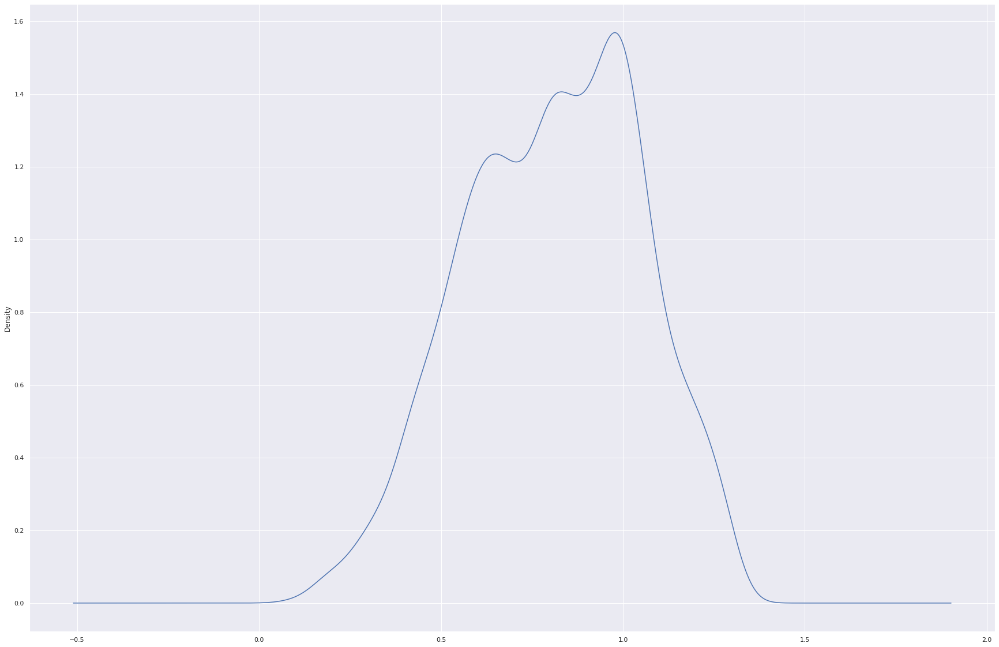

In [120]:
df['Perihelion Distance'].plot.density()

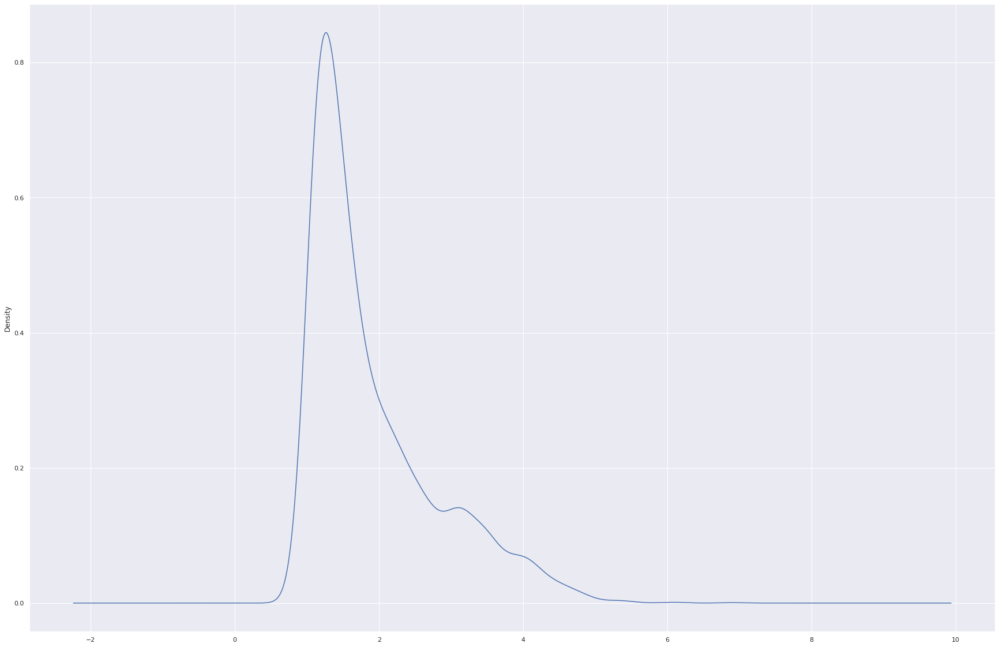

In [121]:
df['Aphelion Dist'].plot.density()

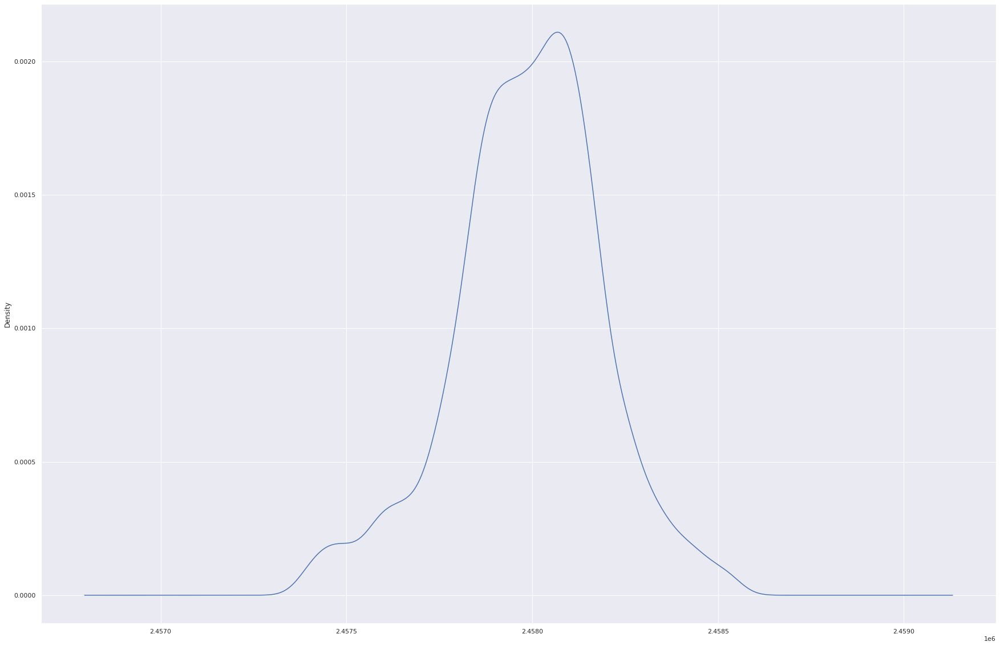

In [122]:
df['Perihelion Time'].plot.density()

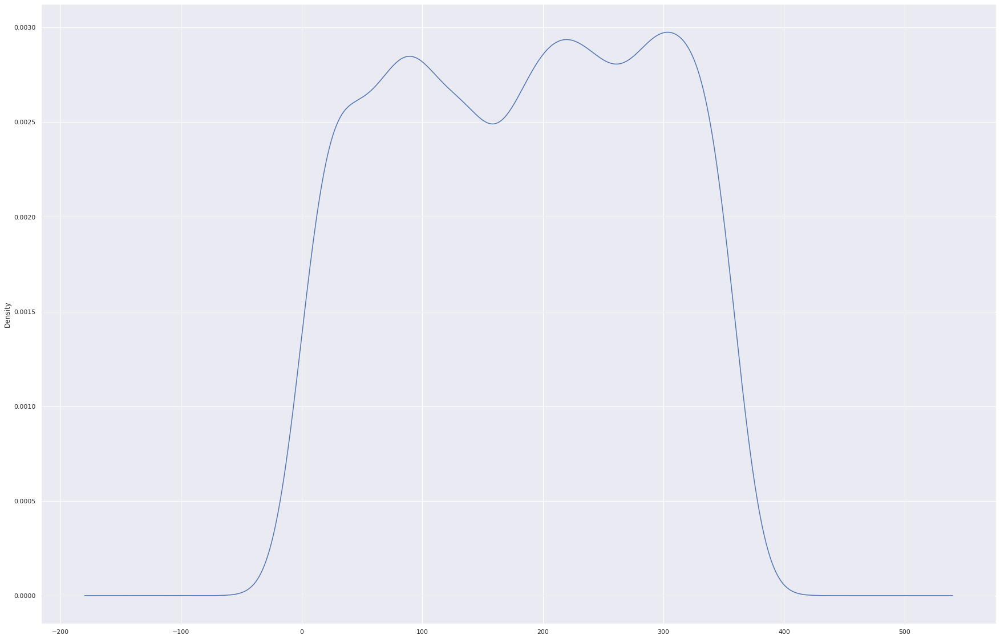

In [123]:
df['Mean Anomaly'].plot.density()

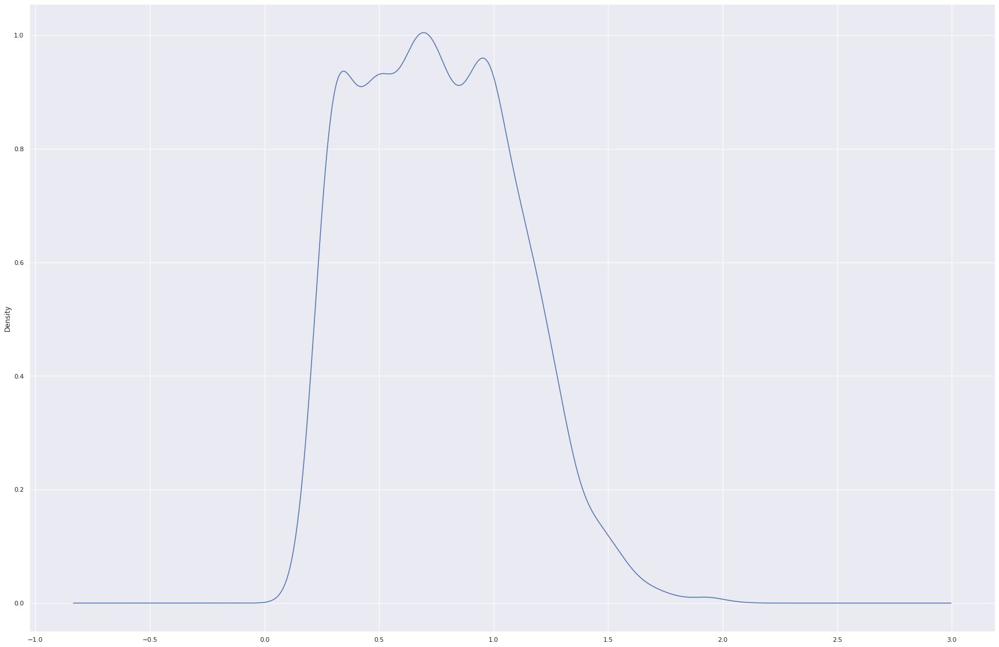

In [124]:
df['Mean Motion'].plot.density()

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f987047cd10>,
      dtype=object)

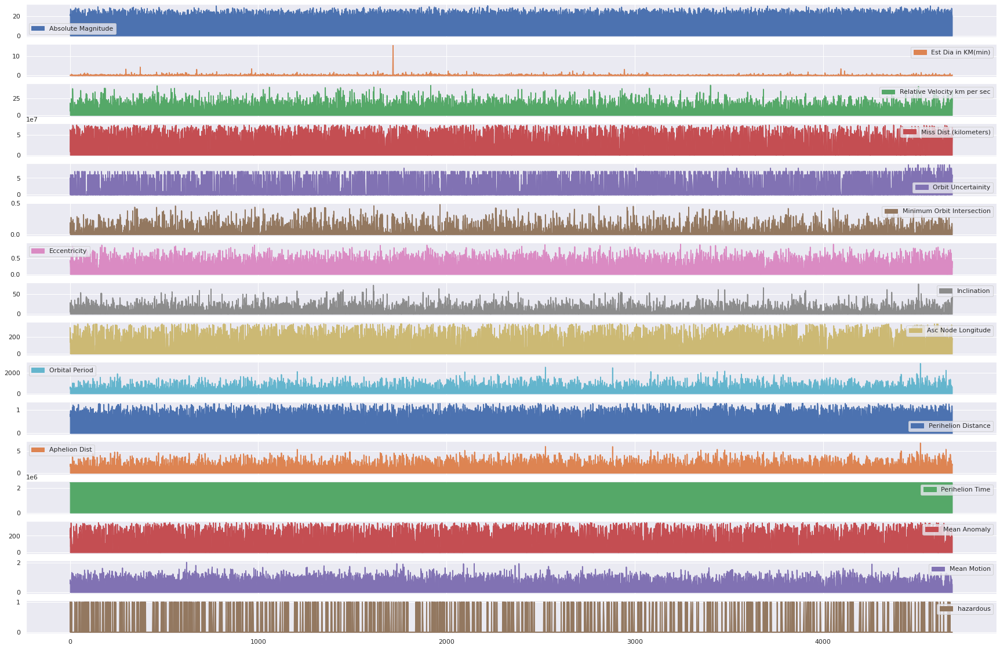

In [80]:
df.plot.area(subplots=True)

In [34]:
X=df.iloc[:,:-1].values
Y=df.iloc[:,-1:].values
Y

array([[1],
       [0],
       [1],
       ...,
       [0],
       [0],
       [0]])

In [35]:
from sklearn.preprocessing import StandardScaler
sst = StandardScaler()

X=sst.fit_transform(X)


In [36]:
#splitting the dataset into train and test
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.2,random_state=1,shuffle=True)

In [37]:
from sklearn.linear_model import LogisticRegression
model=LogisticRegression()
model.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [38]:
y_pred = model.predict(x_test)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [0 0]
 [0 0]
 ...
 [1 1]
 [1 1]
 [0 0]]


In [39]:
print("predicted value for training data",model.score(x_train,y_train))
print("predicted value for testing data",model.score(x_test,y_test))


predicted value for training data 0.9543392803144845
predicted value for testing data 0.9455864570737605


In [40]:
accuracy=model.score(X,Y)*100
print(accuracy)

95.25882922109338


In [41]:
from sklearn.tree import DecisionTreeClassifier
model2=DecisionTreeClassifier()
model2.fit(x_train,y_train)

DecisionTreeClassifier()

In [42]:
y_pred2 = model.predict(x_test)
print(np.concatenate((y_pred2.reshape(len(y_pred2),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [0 0]
 [0 0]
 ...
 [1 1]
 [1 1]
 [0 0]]


In [43]:
print("predicted value for training data",model2.score(x_train,y_train))
print("predicted value for testing data",model2.score(x_test,y_test))


predicted value for training data 1.0
predicted value for testing data 0.9987908101571947


In [44]:
accuracy=model2.score(X,Y)*100
print(accuracy)

99.97581035316885


In [45]:
from sklearn.naive_bayes import GaussianNB
Model3 = GaussianNB()
Model3.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GaussianNB()

In [46]:
y_pred3 = model.predict(x_test)
print(np.concatenate((y_pred3.reshape(len(y_pred3),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [0 0]
 [0 0]
 ...
 [1 1]
 [1 1]
 [0 0]]


In [47]:
print("predicted value for training data",Model3.score(x_train,y_train))
print("predicted value for testing data",Model3.score(x_test,y_test))


predicted value for training data 0.9516177804656789
predicted value for testing data 0.9552599758162031


In [48]:
accuracy=Model3.score(X,Y)*100
print(accuracy)

95.23463957426222


In [49]:
from sklearn.neighbors import KNeighborsClassifier
model4 = KNeighborsClassifier()
model4.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier()

In [50]:
print("predicted value for training data",model4.score(x_train,y_train))
print("predicted value for testing data",model4.score(x_test,y_test))


predicted value for training data 0.9371031146053825
predicted value for testing data 0.8863361547762999


In [51]:
accuracy=model4.score(X,Y)*100
print(accuracy)

92.69472665699081


In [52]:
from sklearn.ensemble import RandomForestClassifier
model5 = RandomForestClassifier()
model5.fit(x_train,y_train)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  This is separate from the ipykernel package so we can avoid doing imports until


RandomForestClassifier()

In [53]:
y_pred5 = model5.predict(x_test)
print(np.concatenate((y_pred5.reshape(len(y_pred5),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [0 0]
 [0 0]
 ...
 [1 1]
 [1 1]
 [0 0]]


In [54]:
print("predicted value for training data",model5.score(x_train,y_train))
print("predicted value for testing data",model5.score(x_test,y_test))


predicted value for training data 1.0
predicted value for testing data 0.9987908101571947


In [55]:
accuracy=model5.score(X,Y)*100
print(accuracy)

99.97581035316885
